# Assignment 1 - Q1

## <span style="color: green;">Image Segmentation</span>

1. Installing opencv <br>

In [1]:
# importing packages
import cv2
import os
import numpy as np
import matplotlib.pyplot as plt

In [2]:
# Load the image
folder_path= "C:\\Users\\Zunaira\\Downloads\\Assignment_1_upload\\Assignment_1_upload\\Data"
image_path = "C:\\Users\\Zunaira\\Downloads\\Assignment_1_upload\\Assignment_1_upload\\Data\\20240904_091442.jpg"  # Update with the actual image path if needed
image = cv2.imread(image_path)


## <span style="color: cyan;">1. Segment Signatures</span>

In [3]:
# Parameters for grid segmentation
# The following values are estimated based on the image.
rows = 12  # Number of rows (people)
cols = 4   # Number of columns (signatures per person)

In [4]:
# Create directory to store segmented signatures
#"C:\\Users\\Zunaira\\Documents\\7th Semester\\Gen AI\\Assignments\\Assignment_1_upload\\Output"
output_dir = "C:\\Users\\Zunaira\\Documents\\7th Semester\\Gen AI\\Assignments\\Assignment_1_upload\\Output"
if not os.path.exists(output_dir):
    os.makedirs(output_dir)

### <span style="color: orange;">-- Image Alignment</span>

In [5]:
cropped_image= image

### <span style="color: orange;">-- Convert to Gray Scale</span>

8000 6000


(-0.5, 5999.5, 7999.5, -0.5)

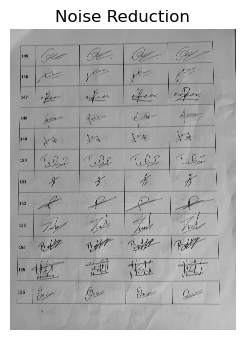

In [6]:

# Convert to grayscale
gray = cv2.cvtColor(image , cv2.COLOR_BGR2GRAY)
image_height = gray.shape[0]
image_weight = gray.shape[1]
print (image_height, image_weight)
plt.subplot(1, 2, 1)
plt.imshow(cv2.cvtColor(gray , cv2.COLOR_BGR2RGB))
plt.title('Noise Reduction')
plt.axis('off')

### <span style="color: orange;">-- Guassian Blur</span>

In [7]:
# Apply Gaussian Blur to smooth the image
blurred = cv2.GaussianBlur(gray, (5, 5), 0)

### <span style="color: orange;">-- Thresholding</span>

(-0.5, 5999.5, 7999.5, -0.5)

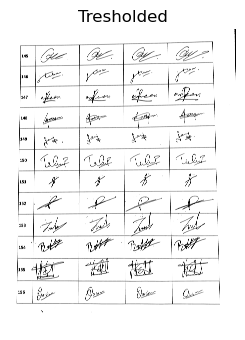

In [8]:
threshold_value = 127
max_value = 255
_, thresholded = cv2.threshold(blurred, threshold_value, max_value, cv2.THRESH_BINARY)
plt.subplot(1, 2, 1)
plt.imshow(cv2.cvtColor(thresholded , cv2.COLOR_BGR2RGB))
plt.title('Tresholded')
plt.axis('off')

### <span style="color: orange;">-- Contour Detection</span>

In [9]:

# Detect contours on the noise-reduced binary image
contours, _ = cv2.findContours(thresholded, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)


# Initialize a list to hold filtered contours
filtered_contours = []

# Set your conditions for height and width
min_width = 10   # Minimum width condition
min_height = 10  # Minimum height condition
max_width = 200  # Maximum width condition
max_height = 200 # Maximum height condition

# Loop through each contour and apply the conditions
for contour in contours:
    x, y, w, h = cv2.boundingRect(contour)
    
    # Check if the width and height meet the specified conditions
    if (min_width <= w <= max_width) and (min_height <= h <= max_height):
        filtered_contours.append(contour)

# Draw the filtered contours on the original image
image_filtered_contours = image.copy()
cv2.drawContours(image_filtered_contours, filtered_contours, -1, (255, 0, 0), 2, cv2.LINE_AA)

array([[[186, 177, 174],
        [189, 180, 177],
        [190, 181, 178],
        ...,
        [ 17,  50,  89],
        [ 16,  49,  88],
        [ 16,  49,  88]],

       [[188, 179, 176],
        [190, 181, 178],
        [190, 181, 178],
        ...,
        [ 16,  49,  88],
        [ 16,  49,  88],
        [ 16,  49,  88]],

       [[189, 180, 177],
        [190, 181, 178],
        [190, 181, 178],
        ...,
        [ 16,  49,  88],
        [ 16,  49,  88],
        [ 17,  50,  89]],

       ...,

       [[150, 154, 155],
        [147, 151, 152],
        [142, 146, 147],
        ...,
        [185, 183, 182],
        [183, 181, 180],
        [182, 180, 179]],

       [[149, 153, 154],
        [146, 150, 151],
        [141, 145, 146],
        ...,
        [186, 184, 183],
        [185, 183, 182],
        [185, 183, 182]],

       [[150, 154, 155],
        [147, 151, 152],
        [141, 145, 146],
        ...,
        [186, 184, 183],
        [185, 183, 182],
        [185, 183, 182]]

In [10]:
# Create an empty mask
mask = np.zeros_like(image)

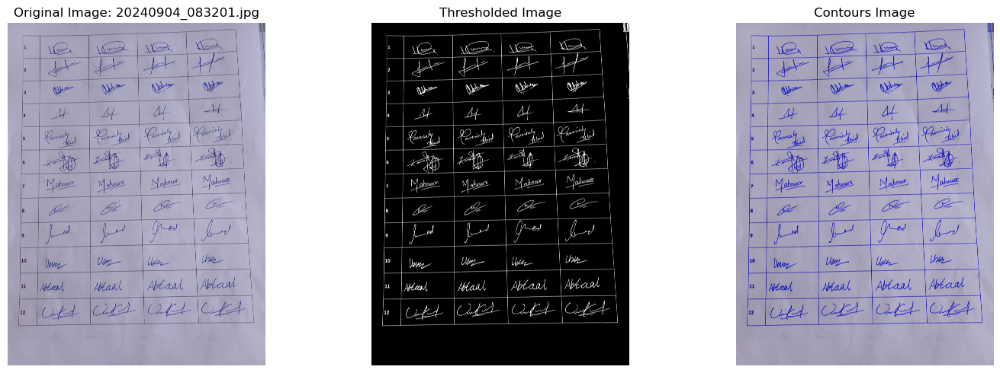

Processed 20240904_083201.jpg


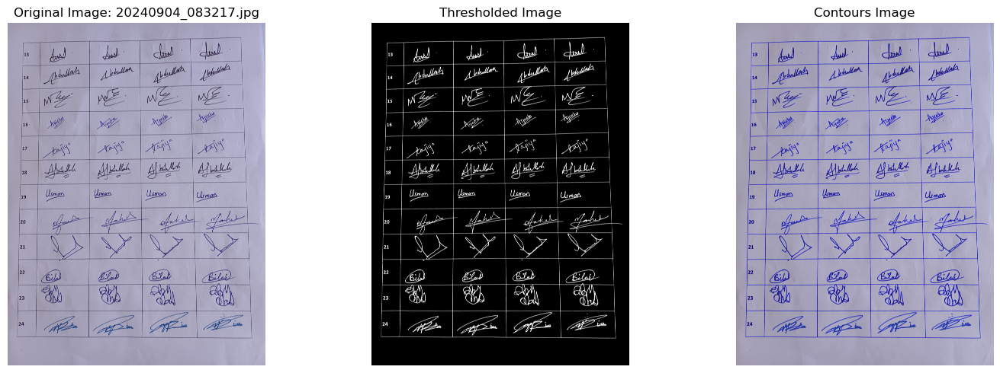

Processed 20240904_083217.jpg


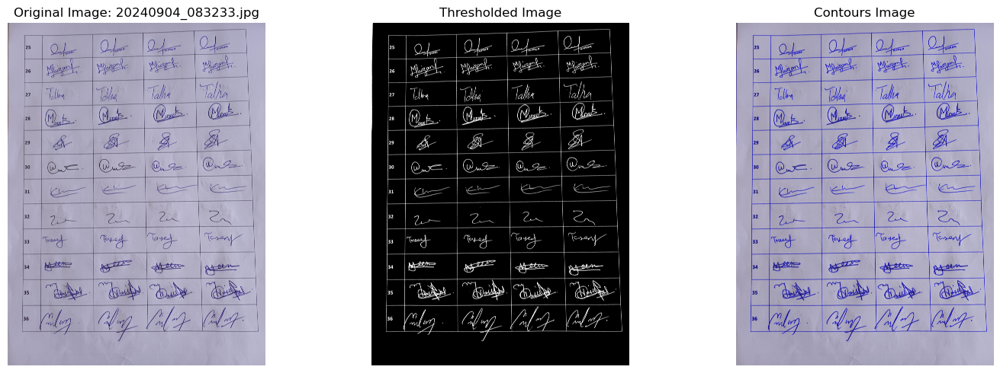

Processed 20240904_083233.jpg


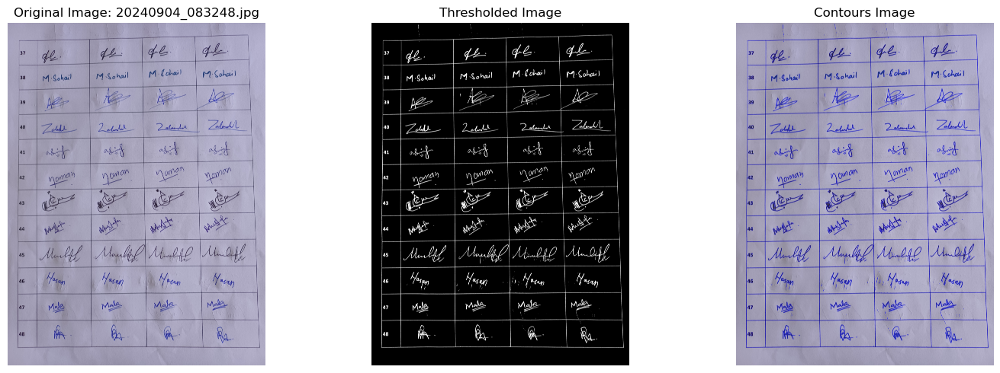

Processed 20240904_083248.jpg


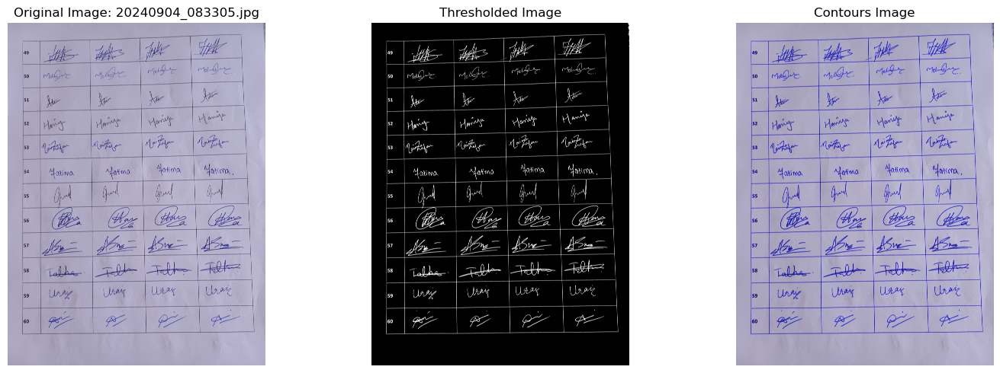

Processed 20240904_083305.jpg


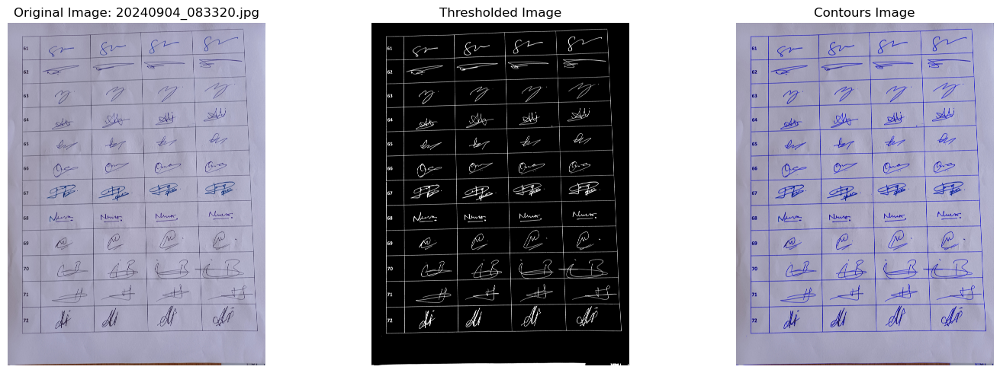

Processed 20240904_083320.jpg


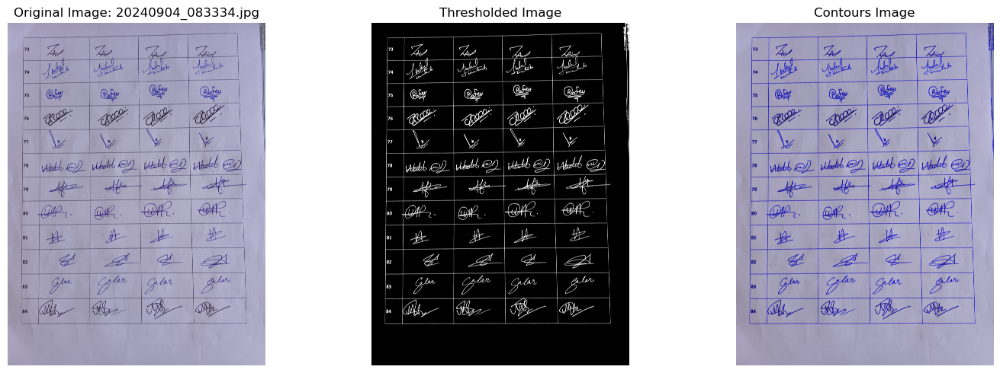

Processed 20240904_083334.jpg


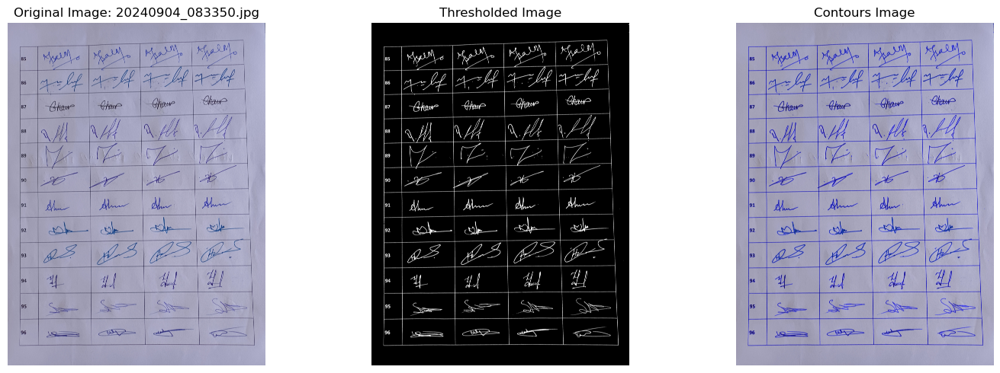

Processed 20240904_083350.jpg


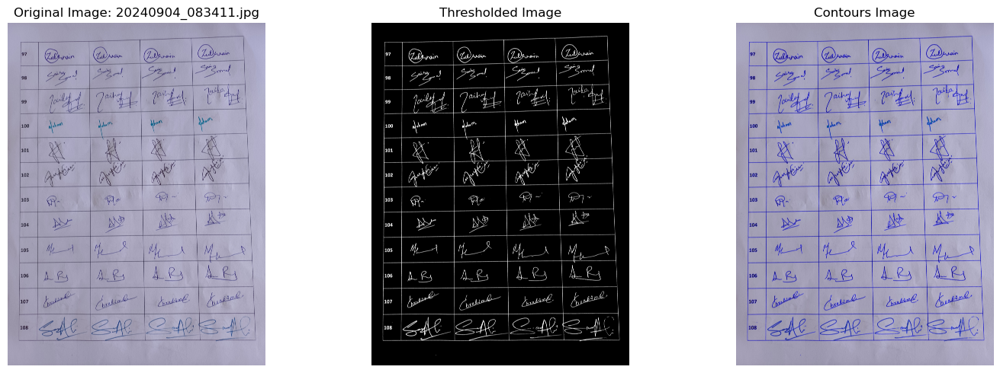

Processed 20240904_083411.jpg


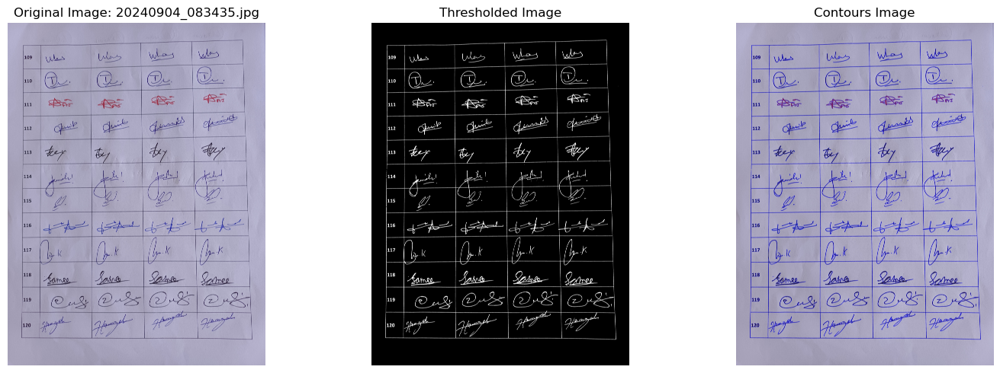

Processed 20240904_083435.jpg


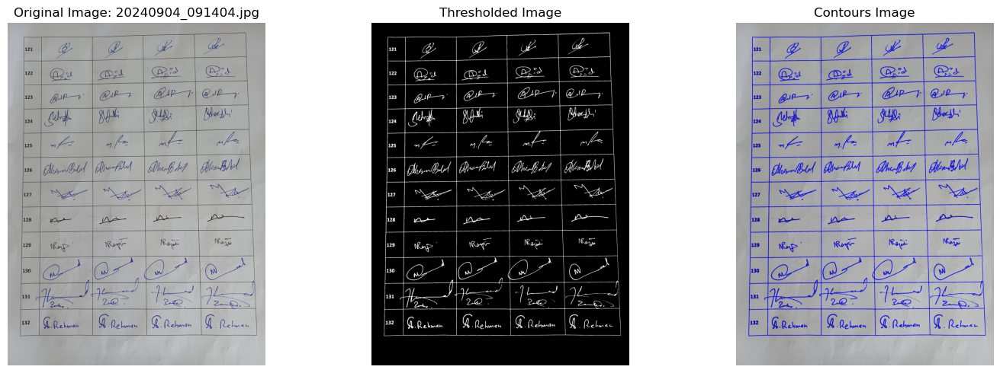

Processed 20240904_091404.jpg


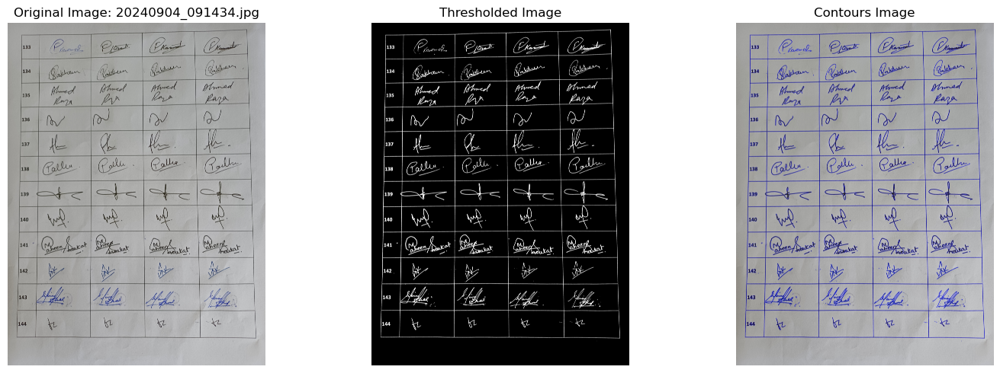

Processed 20240904_091434.jpg


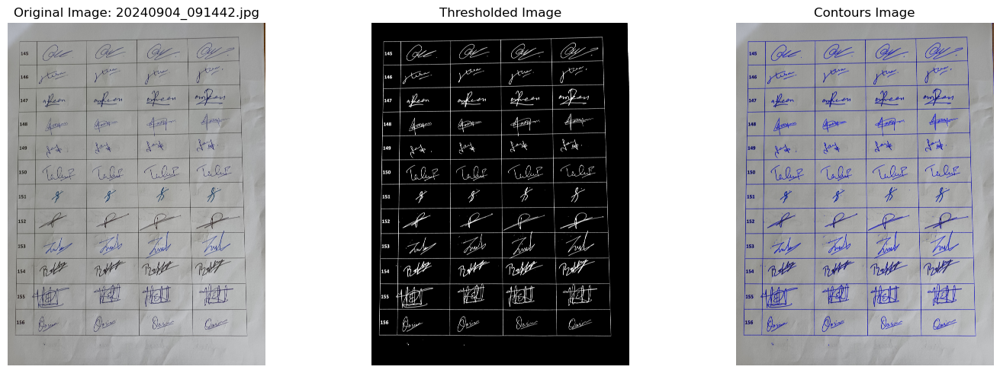

Processed 20240904_091442.jpg


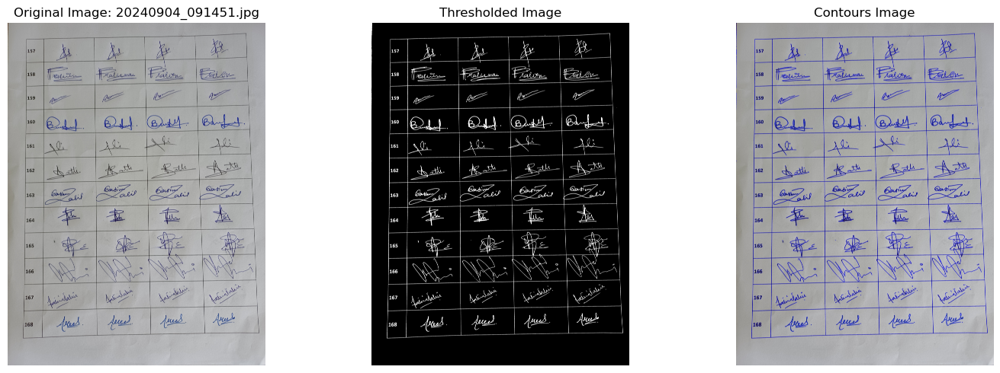

Processed 20240904_091451.jpg


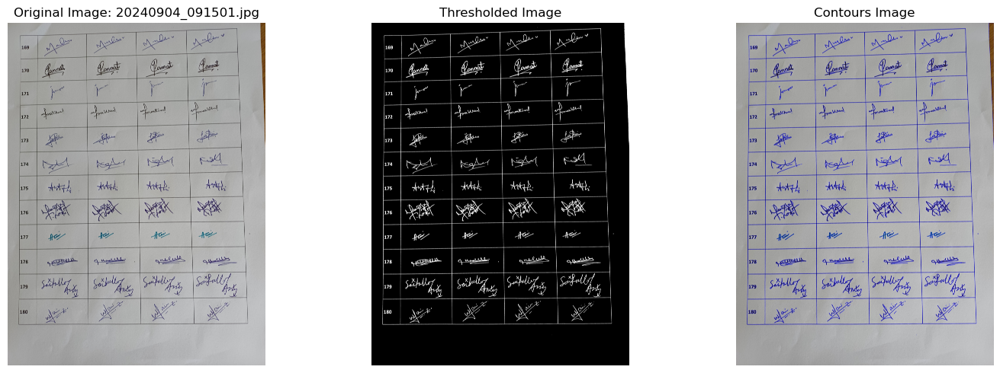

Processed 20240904_091501.jpg


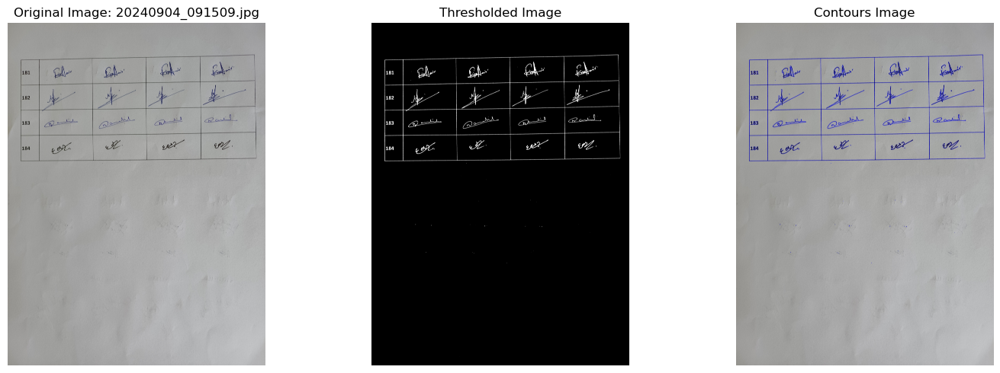

Processed 20240904_091509.jpg


In [11]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import os

# Define the path to your folder containing images
folder_path = "C:\\Users\\Zunaira\\Downloads\\Assignment_1_upload\\Assignment_1_upload\\Data"  # Update with your actual folder path

# List all files in the folder (you may want to filter out non-image files)
image_files = [f for f in os.listdir(folder_path) if f.endswith(('.jpg', '.jpeg', '.png'))]

# Loop through all images in the folder
for image_file in image_files:
    i = 0
    image_path = os.path.join(folder_path, image_file)  # Get full path to the image
    
    # Load the image
    image = cv2.imread(image_path)
    
    if image is None:
        print(f"Failed to load {image_file}")
        continue  # Skip if the image failed to load
    
    # Convert the image to grayscale
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    
    # Apply Median Blur to remove noise (good for salt-and-pepper noise)
    median_blurred = cv2.medianBlur(gray, 5)
    
    # Apply Gaussian Blur to further smooth the image and reduce noise
    gaussian_blurred = cv2.GaussianBlur(median_blurred, (5, 5), 0)
    
    # Apply thresholding (simple threshold instead of adaptive)
    threshold_value = 127
    max_value = 255
    _, thresholded = cv2.threshold(gaussian_blurred, threshold_value, max_value, cv2.THRESH_BINARY_INV)
    
    # Apply Morphological Opening to remove small dots and noise
    kernel = np.ones((3, 3), np.uint8)
    morph_open = cv2.morphologyEx(thresholded, cv2.MORPH_OPEN, kernel)
    
    # Apply Morphological Closing to close gaps inside the shapes
    morph_close = cv2.morphologyEx(morph_open, cv2.MORPH_CLOSE, kernel)
    
    # Detect contours on the noise-reduced binary image
    contours, hierarchy = cv2.findContours(morph_close, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)
    
    # Draw contours on the original image (if you want to visualize the contours)
    image_contours = image.copy()
    cv2.drawContours(image_contours, contours, -1, (255, 0, 0), 2, cv2.LINE_AA)
    
    # Set up the subplot for displaying the results
    fig, axes = plt.subplots(1, 3, figsize=(15, 5))  # 1 row, 3 columns
    if i == 0:
        # Display the original image
        axes[0].imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
        axes[0].set_title(f'Original Image: {image_file}')
        axes[0].axis('off')  # Hide axis

        # Display the thresholded image
        axes[1].imshow(thresholded, cmap='gray')
        axes[1].set_title('Thresholded Image')
        axes[1].axis('off')  # Hide axis

        # Display the contours image
        axes[2].imshow(cv2.cvtColor(image_contours, cv2.COLOR_BGR2RGB))
        axes[2].set_title('Contours Image')
        axes[2].axis('off')  # Hide axis

        # Adjust layout and show the plot
        plt.tight_layout()
        plt.show()
    i =i+1
    # Optionally, you can save the images (original, thresholded, and contours) to disk
    # Save thresholded image
    # thresholded_save_path = os.path.join(folder_path, f"thresholded_{image_file}")
    # cv2.imwrite(thresholded_save_path, thresholded)
    
    # Save contours image
    # contours_save_path = os.path.join(folder_path, f"contours_{image_file}")
    # cv2.imwrite(contours_save_path, image_contours)
    
    print(f"Processed {image_file}")


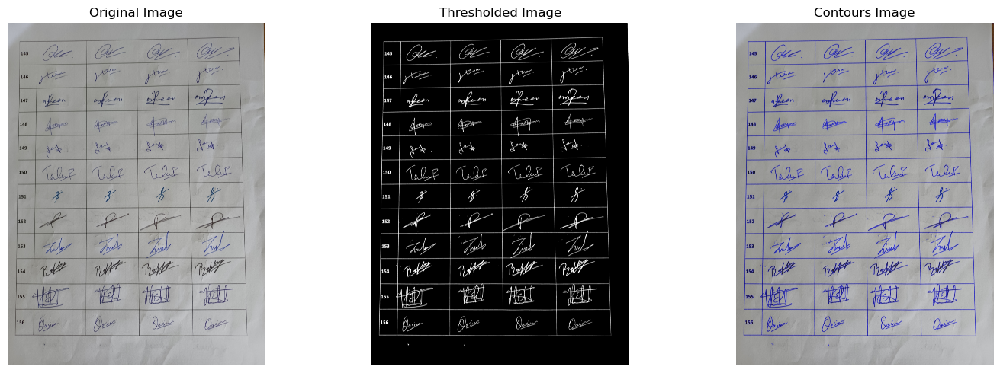

In [12]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Load the uploaded image

image_path = "C:\\Users\\Zunaira\\Downloads\\Assignment_1_upload\\Assignment_1_upload\\Data\\20240904_091442.jpg"  # Update with the actual image path if needed
image = cv2.imread(image_path)

# Convert the image to grayscale
gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

# Apply Median Blur to remove noise (good for salt-and-pepper noise)
median_blurred = cv2.medianBlur(gray, 5)

# Apply Gaussian Blur to further smooth the image and reduce noise
gaussian_blurred = cv2.GaussianBlur(median_blurred, (5, 5), 0)

# Apply thresholding (simple threshold instead of adaptive)
threshold_value = 127
max_value = 255
_, thresholded = cv2.threshold(gaussian_blurred, threshold_value, max_value, cv2.THRESH_BINARY_INV)

# Apply Morphological Opening to remove small dots and noise
kernel = np.ones((3, 3), np.uint8)
morph_open = cv2.morphologyEx(thresholded, cv2.MORPH_OPEN, kernel)

# Apply Morphological Closing to close gaps inside the shapes
morph_close = cv2.morphologyEx(morph_open, cv2.MORPH_CLOSE, kernel)

# Detect contours on the noise-reduced binary image
contours, hierarchy = cv2.findContours(morph_close, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)

# Draw contours on the original image (if you want to visualize the contours)
image_contours = image.copy()
cv2.drawContours(image_contours, contours, -1, (255, 0, 0), 2, cv2.LINE_AA)

# Set up the subplot
fig, axes = plt.subplots(1, 3, figsize=(15, 5))  # 1 row, 3 columns

# Display the images
axes[0].imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
axes[0].set_title('Original Image')
axes[0].axis('off')  # Hide axis

axes[1].imshow(thresholded, cmap='gray')
axes[1].set_title('Thresholded Image')
axes[1].axis('off')  # Hide axis

axes[2].imshow(cv2.cvtColor(image_contours, cv2.COLOR_BGR2RGB))
axes[2].set_title('Contours Image')
axes[2].axis('off')  # Hide axis

# Adjust layout
plt.tight_layout()
plt.show()


### <span style="color: orange;">-- Segmenting Signatures</span>

In [13]:
import cv2
import os
import matplotlib.pyplot as plt

# Set minimum and maximum width and height thresholds for valid signatures
min_width, min_height = 150, 200   # Adjust these values based on your image
max_width, max_height = 850, 500  # Set an upper bound for the signature size

# Create a directory to save individual signatures
output_dir = "C:\\Users\\Zunaira\\Downloads\\Segments"
if not os.path.exists(output_dir):
    os.makedirs(output_dir)

# Define the path to your folder containing images
folder_path = "C:\\Users\\Zunaira\\Downloads\\Assignment_1_upload\\Assignment_1_upload\\Data"  # Update with your actual folder path

# List all files in the folder (you may want to filter out non-image files)
image_files = [f for f in os.listdir(folder_path) if f.endswith(('.jpg', '.jpeg', '.png'))]

# Loop through each image in the folder
for image_file in image_files:
    image_path = os.path.join(folder_path, image_file)  # Get full path to the image
    
    # Load the image
    image = cv2.imread(image_path)
    
    if image is None:
        print(f"Failed to load {image_file}")
        continue  # Skip if the image failed to load
    
    # Convert the image to grayscale
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    
    # Apply Median Blur to remove noise
    median_blurred = cv2.medianBlur(gray, 5)
    
    # Apply Gaussian Blur to further smooth the image and reduce noise
    gaussian_blurred = cv2.GaussianBlur(median_blurred, (5, 5), 0)
    
    # Apply thresholding (simple threshold)
    threshold_value = 127
    max_value = 255
    _, thresholded = cv2.threshold(gaussian_blurred, threshold_value, max_value, cv2.THRESH_BINARY_INV)
    
    # Apply Morphological Opening to remove small dots and noise
    kernel = np.ones((3, 3), np.uint8)
    morph_open = cv2.morphologyEx(thresholded, cv2.MORPH_OPEN, kernel)
    
    # Apply Morphological Closing to close gaps inside the shapes
    morph_close = cv2.morphologyEx(morph_open, cv2.MORPH_CLOSE, kernel)
    
    # Detect contours on the noise-reduced binary image
    contours, hierarchy = cv2.findContours(morph_close, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)

    # Loop through each contour to extract signatures
    signature_count = 0
    for contour in contours:
        # Get the bounding box for the contour
        x, y, w, h = cv2.boundingRect(contour)
        
        # Check if the bounding box meets the size restrictions
        if min_width <= w <= max_width and min_height <= h <= max_height:
            # Extract the region of interest (the signature)
            signature = image[y:y+h, x:x+w]
            
            # Save the signature
            signature_path = os.path.join(output_dir, f"signature_{signature_count}.png")
            cv2.imwrite(signature_path, signature)
            
            # Optionally, display the signature
            #plt.figure()
            #plt.imshow(cv2.cvtColor(signature, cv2.COLOR_BGR2RGB))
            #plt.title(f"Signature {signature_count}, {signature.shape[0]}, {signature.shape[1]}")
            #plt.axis('off')
            #plt.show()  # Display the signature
            
            signature_count += 1

    # Final message for this image
    print(f"Extracted and saved {signature_count} signatures from {image_file}.")

# Final summary message
print("Signature extraction completed for all images.")


Extracted and saved 62 signatures from 20240904_083201.jpg.
Extracted and saved 54 signatures from 20240904_083217.jpg.
Extracted and saved 53 signatures from 20240904_083233.jpg.
Extracted and saved 40 signatures from 20240904_083248.jpg.
Extracted and saved 39 signatures from 20240904_083305.jpg.
Extracted and saved 48 signatures from 20240904_083320.jpg.
Extracted and saved 62 signatures from 20240904_083334.jpg.
Extracted and saved 42 signatures from 20240904_083350.jpg.
Extracted and saved 49 signatures from 20240904_083411.jpg.
Extracted and saved 38 signatures from 20240904_083435.jpg.
Extracted and saved 60 signatures from 20240904_091404.jpg.
Extracted and saved 64 signatures from 20240904_091434.jpg.
Extracted and saved 47 signatures from 20240904_091442.jpg.
Extracted and saved 46 signatures from 20240904_091451.jpg.
Extracted and saved 41 signatures from 20240904_091501.jpg.
Extracted and saved 11 signatures from 20240904_091509.jpg.
Signature extraction completed for all i

Extracted and saved 11 signatures.


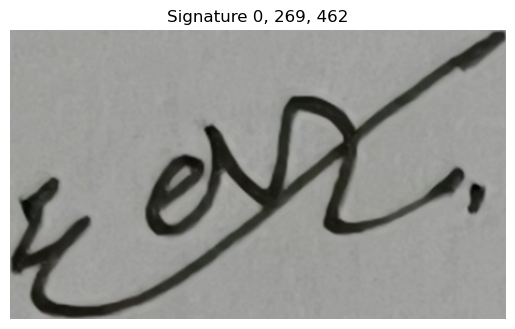

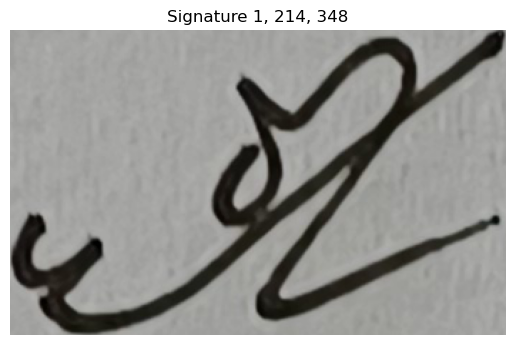

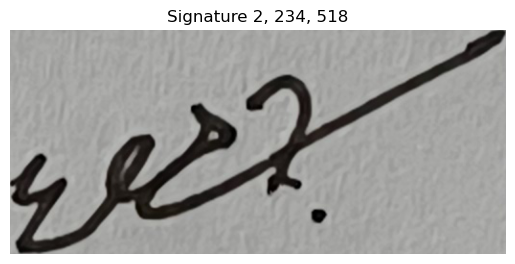

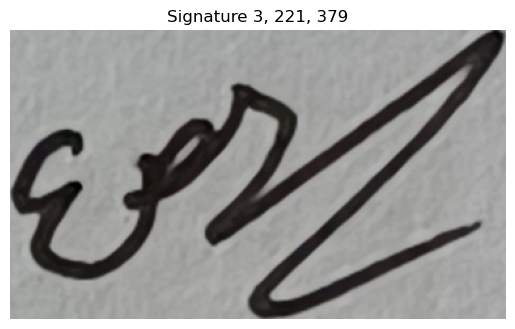

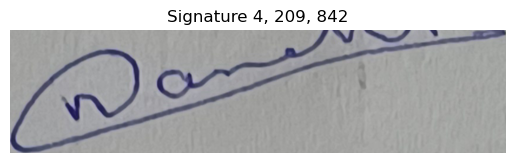

...

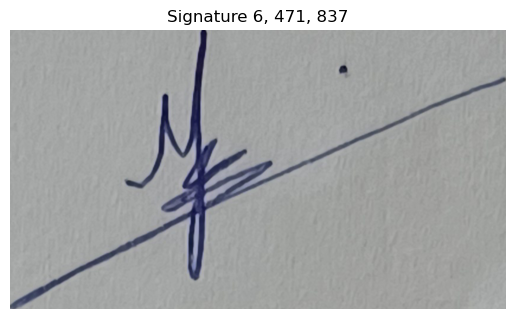

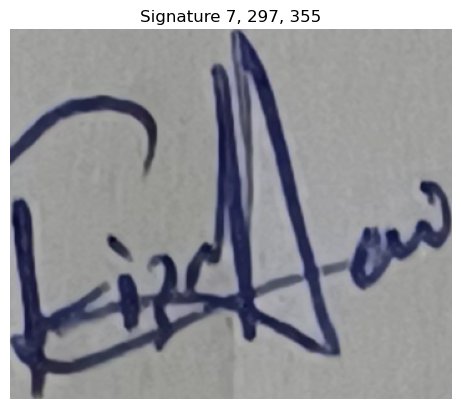

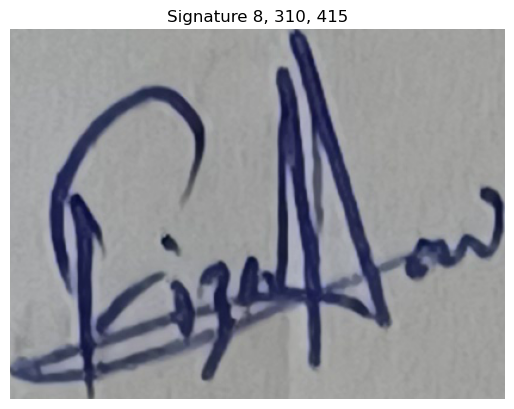

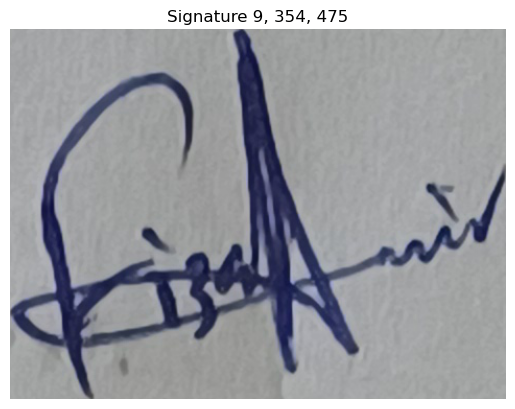

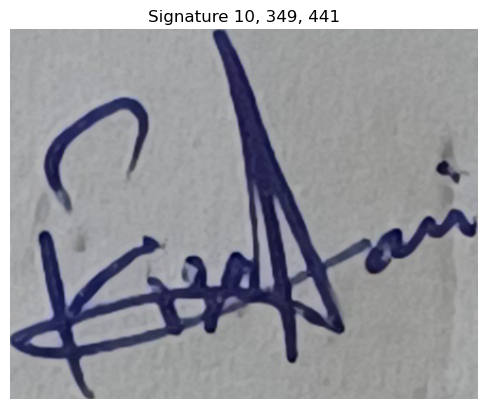

In [14]:
import cv2
import os
import matplotlib.pyplot as plt

# Set minimum and maximum width and height thresholds for valid signatures
min_width, min_height = 130, 200   # Adjust these values based on your image
max_width, max_height = 850, 500  # Set an upper bound for the signature size

# Create a directory to save individual signatures
output_dir = "C:\\Users\\Zunaira\\Downloads\\Segments"
if not os.path.exists(output_dir):
    os.makedirs(output_dir)

# Loop through each contour to extract signatures
signature_count = 0
for contour in contours:
    # Get the bounding box for the contour
    x, y, w, h = cv2.boundingRect(contour)
    
    # Check if the bounding box meets the size restrictions
    if min_width <= w <= max_width and min_height <= h <= max_height:
        # Extract the region of interest (the signature)
        signature = image[y:y+h, x:x+w]
        
        # Save or display the signature
        signature_path = os.path.join(output_dir, f"signature_{signature_count}.png")
        cv2.imwrite(signature_path, signature)
        
        # Optionally, display the signature
        plt.figure()
        plt.imshow(cv2.cvtColor(signature, cv2.COLOR_BGR2RGB))
        plt.title(f"Signature {signature_count}, {signature.shape[0]}, {signature.shape[1]}")
        plt.axis('off')
        
        signature_count += 1

# Final message
print(f"Extracted and saved {signature_count} signatures.")


### <span style="color: orange;">-- Storing in output Folder</span>

In [15]:
import os

segmented_dir = "C:\\Users\\Zunaira\\Downloads\\Segments"
# Loop through the contours and segment the image
for i, contour in enumerate(image_contours):
    # Get the bounding box of the contour
    x, y, w, h = cv2.boundingRect(contour)
    # Extract the region of interest (ROI) from the original image
    roi = image[y:y+h, x:x+w]

    # Save the segmented ROI as a separate image
    segment_path = os.path.join(segmented_dir, f'segment_{i+1}.png')
    cv2.imwrite(segment_path, roi)

    print(f'Saved {segment_path}')

print(f'All segments saved in folder: {segmented_dir}')


Saved C:\Users\Zunaira\Downloads\Segments\segment_1.png
Saved C:\Users\Zunaira\Downloads\Segments\segment_2.png
Saved C:\Users\Zunaira\Downloads\Segments\segment_3.png
Saved C:\Users\Zunaira\Downloads\Segments\segment_4.png
Saved C:\Users\Zunaira\Downloads\Segments\segment_5.png
Saved C:\Users\Zunaira\Downloads\Segments\segment_6.png
Saved C:\Users\Zunaira\Downloads\Segments\segment_7.png
Saved C:\Users\Zunaira\Downloads\Segments\segment_8.png
Saved C:\Users\Zunaira\Downloads\Segments\segment_9.png
Saved C:\Users\Zunaira\Downloads\Segments\segment_10.png
Saved C:\Users\Zunaira\Downloads\Segments\segment_11.png
Saved C:\Users\Zunaira\Downloads\Segments\segment_12.png
Saved C:\Users\Zunaira\Downloads\Segments\segment_13.png
Saved C:\Users\Zunaira\Downloads\Segments\segment_14.png
Saved C:\Users\Zunaira\Downloads\Segments\segment_15.png
Saved C:\Users\Zunaira\Downloads\Segments\segment_16.png
Saved C:\Users\Zunaira\Downloads\Segments\segment_17.png
Saved C:\Users\Zunaira\Downloads\Segment

### <span style="color: orange;">-- Splitting rows acc. to people</span>

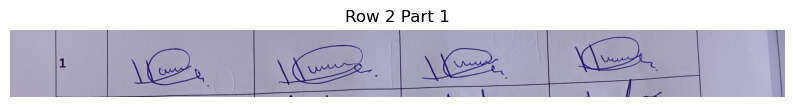

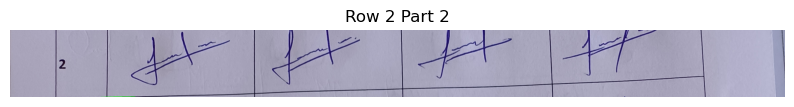

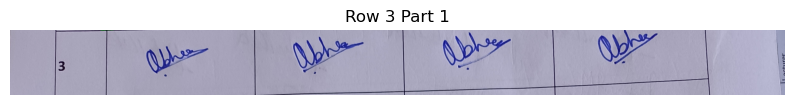

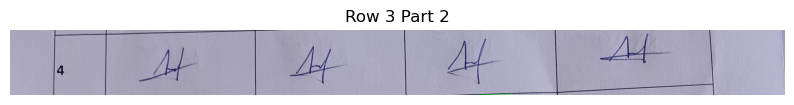

Row 9 in 20240904_083201.jpg skipped due to minimum height restriction (Height: 8px)


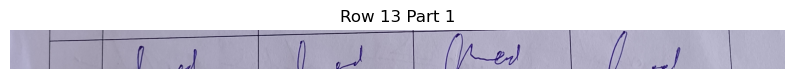

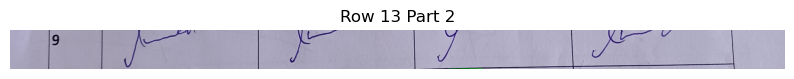

Row 15 in 20240904_083201.jpg skipped due to minimum height restriction (Height: 5px)


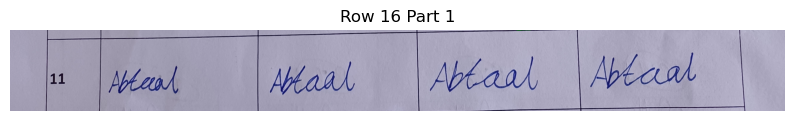

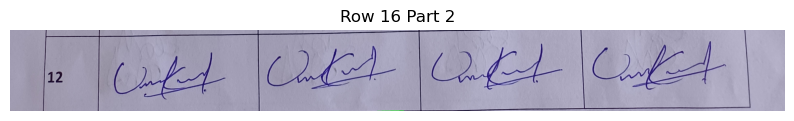

Row 1 in 20240904_083217.jpg skipped due to minimum height restriction (Height: 8px)
Row 3 in 20240904_083217.jpg skipped due to minimum height restriction (Height: 6px)


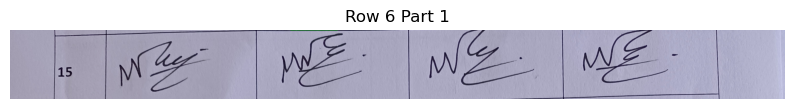

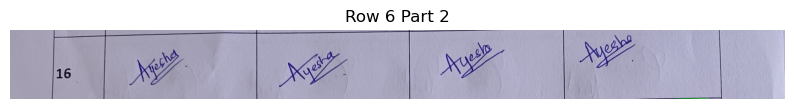

Row 9 in 20240904_083217.jpg skipped due to minimum height restriction (Height: 4px)
Row 11 in 20240904_083217.jpg skipped due to minimum height restriction (Height: 8px)
Row 13 in 20240904_083217.jpg skipped due to minimum height restriction (Height: 6px)
Row 18 in 20240904_083217.jpg skipped due to minimum height restriction (Height: 2px)
Row 20 in 20240904_083217.jpg skipped due to minimum height restriction (Height: 7px)
Row 21 in 20240904_083217.jpg skipped due to minimum height restriction (Height: 2px)
Row 23 in 20240904_083217.jpg skipped due to minimum height restriction (Height: 6px)
Row 24 in 20240904_083217.jpg skipped due to minimum height restriction (Height: 1px)
Row 25 in 20240904_083217.jpg skipped due to minimum height restriction (Height: 1px)
Row 26 in 20240904_083217.jpg skipped due to minimum height restriction (Height: 4px)
Row 27 in 20240904_083217.jpg skipped due to minimum height restriction (Height: 2px)
Row 28 in 20240904_083217.jpg skipped due to minimum he

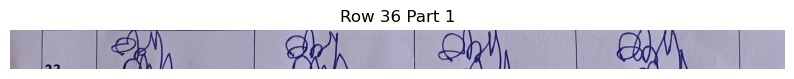

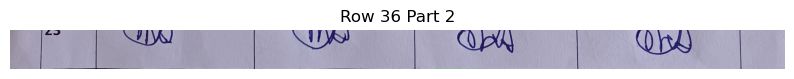

Row 37 in 20240904_083217.jpg skipped due to minimum height restriction (Height: 2px)
Row 38 in 20240904_083217.jpg skipped due to minimum height restriction (Height: 2px)
Row 39 in 20240904_083217.jpg skipped due to minimum height restriction (Height: 2px)
Row 40 in 20240904_083217.jpg skipped due to minimum height restriction (Height: 2px)
Row 41 in 20240904_083217.jpg skipped due to minimum height restriction (Height: 1px)
Row 42 in 20240904_083217.jpg skipped due to minimum height restriction (Height: 1px)
Row 44 in 20240904_083217.jpg skipped due to minimum height restriction (Height: 4px)
Row 45 in 20240904_083217.jpg skipped due to minimum height restriction (Height: 2px)
Row 46 in 20240904_083217.jpg skipped due to minimum height restriction (Height: 6px)
Row 47 in 20240904_083217.jpg skipped due to minimum height restriction (Height: 6px)
Row 48 in 20240904_083217.jpg skipped due to minimum height restriction (Height: 6px)
Row 49 in 20240904_083217.jpg skipped due to minimum h

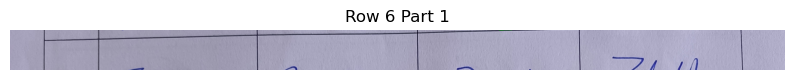

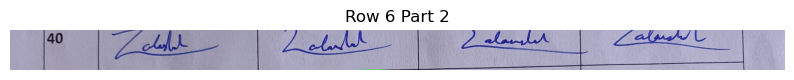

Row 8 in 20240904_083248.jpg skipped due to minimum height restriction (Height: 8px)
Row 11 in 20240904_083248.jpg skipped due to minimum height restriction (Height: 5px)
Row 14 in 20240904_083248.jpg skipped due to minimum height restriction (Height: 4px)
Row 20 in 20240904_083248.jpg skipped due to minimum height restriction (Height: 9px)
Row 21 in 20240904_083248.jpg skipped due to minimum height restriction (Height: 6px)
Row 23 in 20240904_083248.jpg skipped due to minimum height restriction (Height: 2px)
Row 24 in 20240904_083248.jpg skipped due to minimum height restriction (Height: 4px)
Row 25 in 20240904_083248.jpg skipped due to minimum height restriction (Height: 2px)
Row 26 in 20240904_083248.jpg skipped due to minimum height restriction (Height: 4px)
Row 28 in 20240904_083248.jpg skipped due to minimum height restriction (Height: 6px)
Row 30 in 20240904_083248.jpg skipped due to minimum height restriction (Height: 2px)
Row 31 in 20240904_083248.jpg skipped due to minimum he

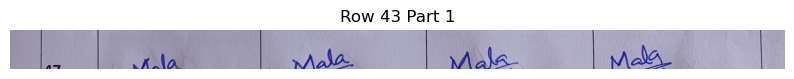

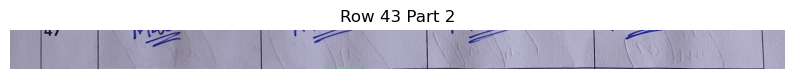

Row 44 in 20240904_083248.jpg skipped due to minimum height restriction (Height: 2px)
Row 45 in 20240904_083248.jpg skipped due to minimum height restriction (Height: 2px)
Row 46 in 20240904_083248.jpg skipped due to minimum height restriction (Height: 2px)
Row 47 in 20240904_083248.jpg skipped due to minimum height restriction (Height: 8px)


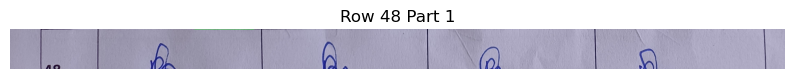

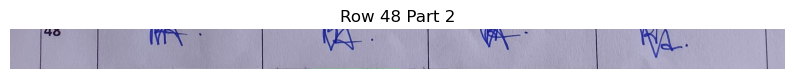

Row 49 in 20240904_083248.jpg skipped due to minimum height restriction (Height: 2px)
Row 50 in 20240904_083248.jpg skipped due to minimum height restriction (Height: 4px)
Row 51 in 20240904_083248.jpg skipped due to minimum height restriction (Height: 1px)
Row 52 in 20240904_083248.jpg skipped due to minimum height restriction (Height: 1px)
Row 53 in 20240904_083248.jpg skipped due to minimum height restriction (Height: 2px)
Row 54 in 20240904_083248.jpg skipped due to minimum height restriction (Height: 2px)
Row 55 in 20240904_083248.jpg skipped due to minimum height restriction (Height: 6px)
Row 56 in 20240904_083248.jpg skipped due to minimum height restriction (Height: 2px)
Row 57 in 20240904_083248.jpg skipped due to minimum height restriction (Height: 1px)
Row 58 in 20240904_083248.jpg skipped due to minimum height restriction (Height: 1px)
Row 6 in 20240904_083305.jpg skipped due to minimum height restriction (Height: 6px)
Row 14 in 20240904_083305.jpg skipped due to minimum he

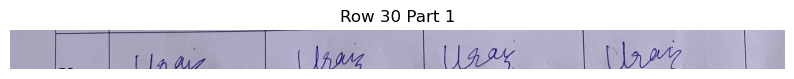

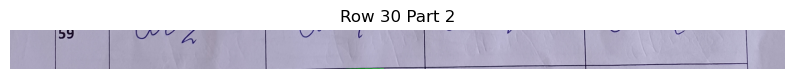

Row 32 in 20240904_083305.jpg skipped due to minimum height restriction (Height: 2px)
Row 35 in 20240904_083305.jpg skipped due to minimum height restriction (Height: 8px)
Row 36 in 20240904_083305.jpg skipped due to minimum height restriction (Height: 4px)
Row 5 in 20240904_083320.jpg skipped due to minimum height restriction (Height: 7px)


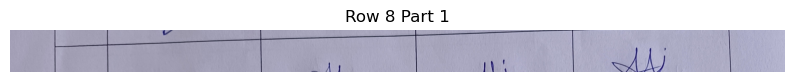

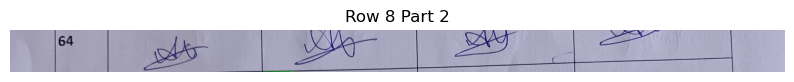

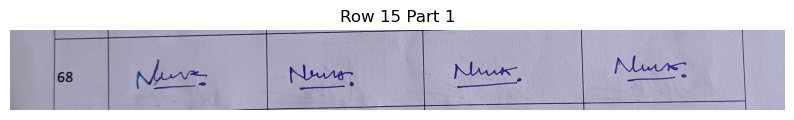

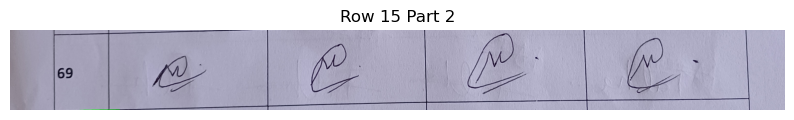

Row 20 in 20240904_083320.jpg skipped due to minimum height restriction (Height: 7px)
Row 21 in 20240904_083320.jpg skipped due to minimum height restriction (Height: 9px)
Row 23 in 20240904_083320.jpg skipped due to minimum height restriction (Height: 6px)


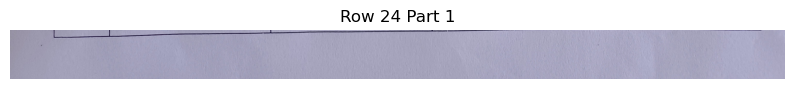

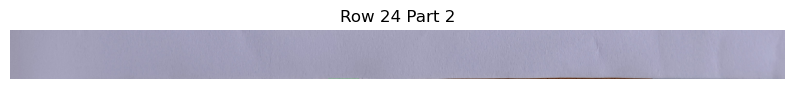

Row 1 in 20240904_083334.jpg skipped due to minimum height restriction (Height: 6px)


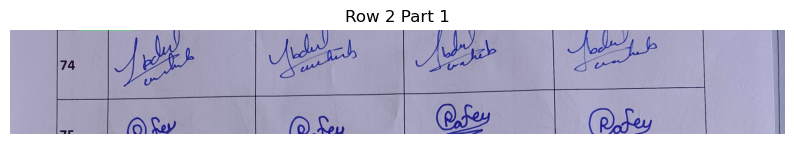

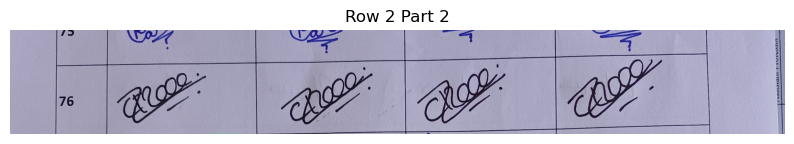

Row 5 in 20240904_083334.jpg skipped due to minimum height restriction (Height: 2px)


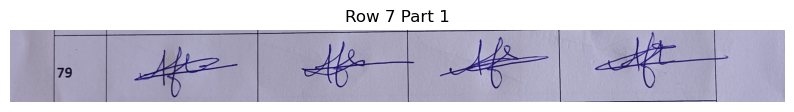

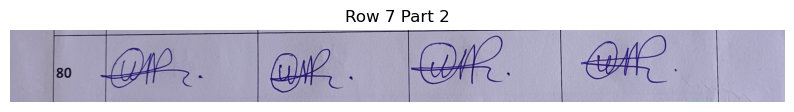

Row 8 in 20240904_083334.jpg skipped due to minimum height restriction (Height: 4px)
Row 9 in 20240904_083334.jpg skipped due to minimum height restriction (Height: 4px)
Row 10 in 20240904_083334.jpg skipped due to minimum height restriction (Height: 2px)
Row 11 in 20240904_083334.jpg skipped due to minimum height restriction (Height: 2px)
Row 12 in 20240904_083334.jpg skipped due to minimum height restriction (Height: 2px)
Row 13 in 20240904_083334.jpg skipped due to minimum height restriction (Height: 6px)
Row 16 in 20240904_083334.jpg skipped due to minimum height restriction (Height: 1px)
Row 17 in 20240904_083334.jpg skipped due to minimum height restriction (Height: 1px)
Row 18 in 20240904_083334.jpg skipped due to minimum height restriction (Height: 4px)
Row 19 in 20240904_083334.jpg skipped due to minimum height restriction (Height: 2px)
Row 20 in 20240904_083334.jpg skipped due to minimum height restriction (Height: 4px)
Row 21 in 20240904_083334.jpg skipped due to minimum hei

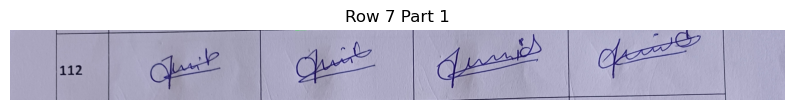

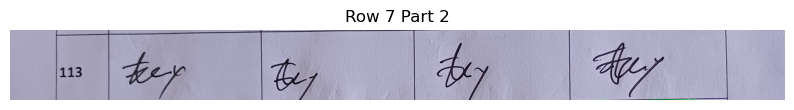

Row 8 in 20240904_083435.jpg skipped due to minimum height restriction (Height: 4px)
Row 11 in 20240904_083435.jpg skipped due to minimum height restriction (Height: 4px)
Row 15 in 20240904_083435.jpg skipped due to minimum height restriction (Height: 8px)
Row 17 in 20240904_083435.jpg skipped due to minimum height restriction (Height: 8px)
Row 18 in 20240904_083435.jpg skipped due to minimum height restriction (Height: 4px)
Row 21 in 20240904_083435.jpg skipped due to minimum height restriction (Height: 1px)
Row 22 in 20240904_083435.jpg skipped due to minimum height restriction (Height: 5px)
Row 23 in 20240904_083435.jpg skipped due to minimum height restriction (Height: 1px)
Row 25 in 20240904_083435.jpg skipped due to minimum height restriction (Height: 1px)
Row 26 in 20240904_083435.jpg skipped due to minimum height restriction (Height: 1px)
Row 27 in 20240904_083435.jpg skipped due to minimum height restriction (Height: 5px)
Row 28 in 20240904_083435.jpg skipped due to minimum he

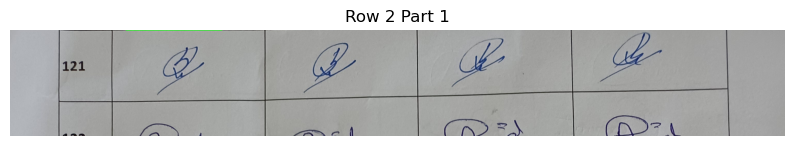

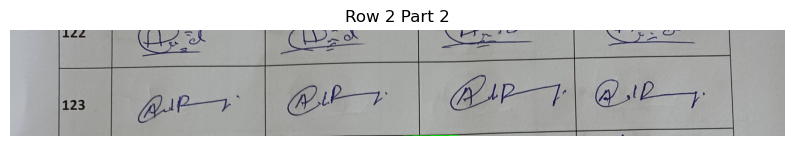

Row 10 in 20240904_091404.jpg skipped due to minimum height restriction (Height: 1px)
Row 11 in 20240904_091404.jpg skipped due to minimum height restriction (Height: 3px)
Row 14 in 20240904_091404.jpg skipped due to minimum height restriction (Height: 2px)
Row 15 in 20240904_091404.jpg skipped due to minimum height restriction (Height: 2px)
Row 16 in 20240904_091404.jpg skipped due to minimum height restriction (Height: 1px)
Row 19 in 20240904_091404.jpg skipped due to minimum height restriction (Height: 1px)
Row 20 in 20240904_091404.jpg skipped due to minimum height restriction (Height: 2px)
Row 21 in 20240904_091404.jpg skipped due to minimum height restriction (Height: 2px)
Row 22 in 20240904_091404.jpg skipped due to minimum height restriction (Height: 1px)
Row 23 in 20240904_091404.jpg skipped due to minimum height restriction (Height: 1px)
Row 24 in 20240904_091404.jpg skipped due to minimum height restriction (Height: 2px)
Row 25 in 20240904_091404.jpg skipped due to minimum h

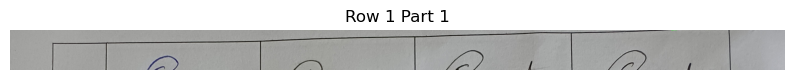

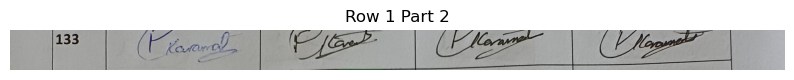

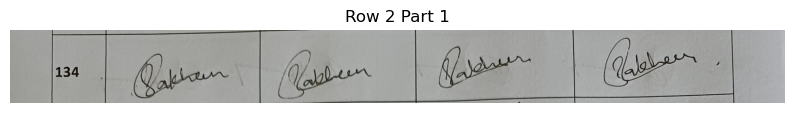

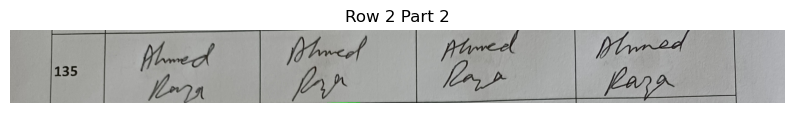

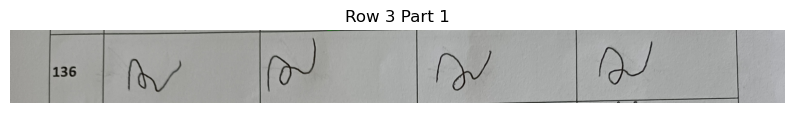

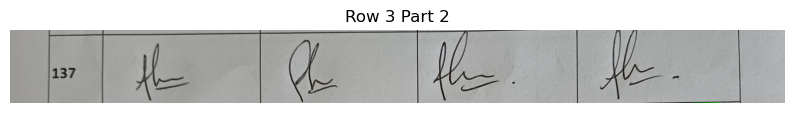

Row 7 in 20240904_091434.jpg skipped due to minimum height restriction (Height: 5px)


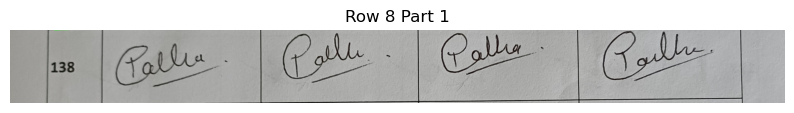

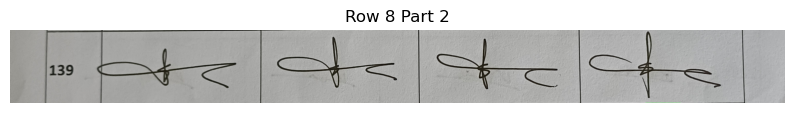

Row 9 in 20240904_091434.jpg skipped due to minimum height restriction (Height: 1px)
Row 10 in 20240904_091434.jpg skipped due to minimum height restriction (Height: 1px)
Row 11 in 20240904_091434.jpg skipped due to minimum height restriction (Height: 3px)
Row 12 in 20240904_091434.jpg skipped due to minimum height restriction (Height: 1px)
Row 13 in 20240904_091434.jpg skipped due to minimum height restriction (Height: 2px)
Row 14 in 20240904_091434.jpg skipped due to minimum height restriction (Height: 2px)
Row 15 in 20240904_091434.jpg skipped due to minimum height restriction (Height: 2px)
Row 16 in 20240904_091434.jpg skipped due to minimum height restriction (Height: 2px)
Row 19 in 20240904_091434.jpg skipped due to minimum height restriction (Height: 2px)
Row 20 in 20240904_091434.jpg skipped due to minimum height restriction (Height: 6px)
Row 21 in 20240904_091434.jpg skipped due to minimum height restriction (Height: 1px)
Row 22 in 20240904_091434.jpg skipped due to minimum he

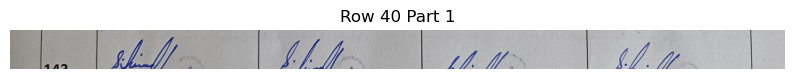

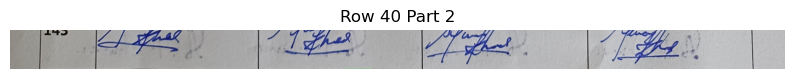

Row 41 in 20240904_091434.jpg skipped due to minimum height restriction (Height: 2px)
Row 42 in 20240904_091434.jpg skipped due to minimum height restriction (Height: 4px)
Row 43 in 20240904_091434.jpg skipped due to minimum height restriction (Height: 4px)
Row 44 in 20240904_091434.jpg skipped due to minimum height restriction (Height: 4px)


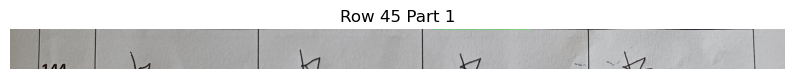

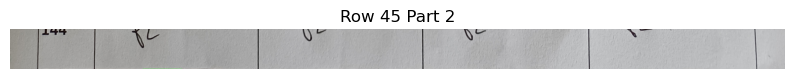

Row 46 in 20240904_091434.jpg skipped due to minimum height restriction (Height: 1px)
Row 47 in 20240904_091434.jpg skipped due to minimum height restriction (Height: 1px)
Row 48 in 20240904_091434.jpg skipped due to minimum height restriction (Height: 2px)
Row 49 in 20240904_091434.jpg skipped due to minimum height restriction (Height: 2px)
Row 50 in 20240904_091434.jpg skipped due to minimum height restriction (Height: 4px)
Row 51 in 20240904_091434.jpg skipped due to minimum height restriction (Height: 2px)
Row 52 in 20240904_091434.jpg skipped due to minimum height restriction (Height: 2px)
Row 53 in 20240904_091434.jpg skipped due to minimum height restriction (Height: 6px)


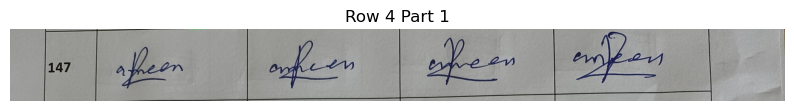

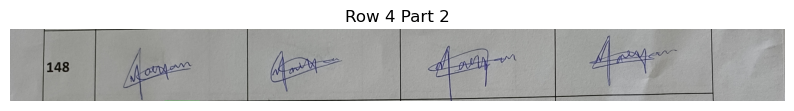

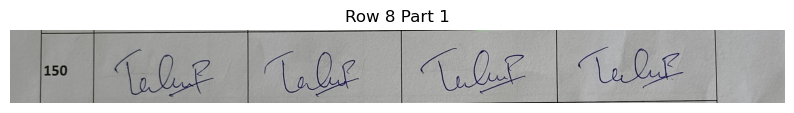

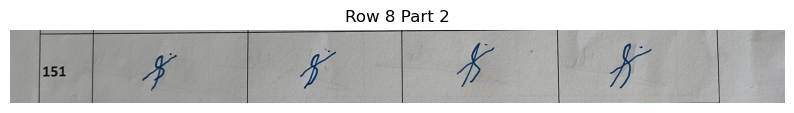

Row 9 in 20240904_091442.jpg skipped due to minimum height restriction (Height: 1px)
Row 10 in 20240904_091442.jpg skipped due to minimum height restriction (Height: 2px)
Row 11 in 20240904_091442.jpg skipped due to minimum height restriction (Height: 2px)
Row 12 in 20240904_091442.jpg skipped due to minimum height restriction (Height: 1px)
Row 13 in 20240904_091442.jpg skipped due to minimum height restriction (Height: 2px)
Row 14 in 20240904_091442.jpg skipped due to minimum height restriction (Height: 4px)
Row 17 in 20240904_091442.jpg skipped due to minimum height restriction (Height: 1px)
Row 18 in 20240904_091442.jpg skipped due to minimum height restriction (Height: 5px)
Row 19 in 20240904_091442.jpg skipped due to minimum height restriction (Height: 1px)
Row 20 in 20240904_091442.jpg skipped due to minimum height restriction (Height: 1px)
Row 21 in 20240904_091442.jpg skipped due to minimum height restriction (Height: 2px)
Row 22 in 20240904_091442.jpg skipped due to minimum he

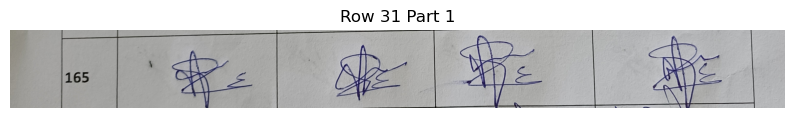

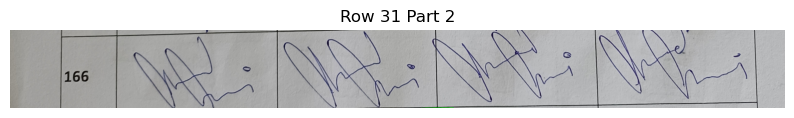

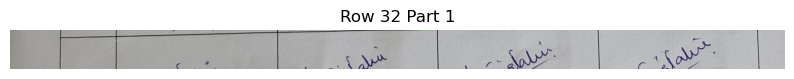

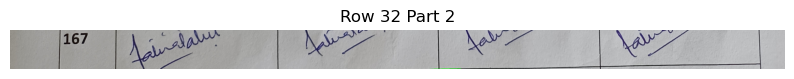

Row 3 in 20240904_091501.jpg skipped due to minimum height restriction (Height: 4px)
Row 13 in 20240904_091501.jpg skipped due to minimum height restriction (Height: 3px)
Row 14 in 20240904_091501.jpg skipped due to minimum height restriction (Height: 7px)
Row 18 in 20240904_091501.jpg skipped due to minimum height restriction (Height: 6px)
Row 21 in 20240904_091501.jpg skipped due to minimum height restriction (Height: 9px)
Row 22 in 20240904_091501.jpg skipped due to minimum height restriction (Height: 9px)
Row 24 in 20240904_091501.jpg skipped due to minimum height restriction (Height: 4px)
Row 25 in 20240904_091501.jpg skipped due to minimum height restriction (Height: 4px)
Row 26 in 20240904_091501.jpg skipped due to minimum height restriction (Height: 2px)
Row 27 in 20240904_091501.jpg skipped due to minimum height restriction (Height: 4px)
Row 30 in 20240904_091501.jpg skipped due to minimum height restriction (Height: 2px)
Row 31 in 20240904_091501.jpg skipped due to minimum he

In [16]:
import cv2
import numpy as np
import os
import matplotlib.pyplot as plt

# Define paths for input images and output images
input_folder = "C:\\Users\\Zunaira\\Downloads\\Assignment_1_upload\\Assignment_1_upload\\Data"  # Update with your actual folder path
output_folder = "C:\\Users\\Zunaira\\Downloads\\Assignment_1_upload\\Assignment_1_upload\\Data\\Segmented_Rows"
person_no = 0


# Define height restrictions (in pixels)
min_row_height = 10  # Minimum height for a row
max_row_height = 600  # Maximum height for a row


# Create the output directory if it does not exist
if not os.path.exists(output_folder):
    os.makedirs(output_folder)

# List all image files in the input folder
image_files = [f for f in os.listdir(input_folder) if f.endswith(('.jpg', '.jpeg', '.png'))]
row_coordinates = []
# Loop through each image in the folder
for image_file in image_files:
    image_path = os.path.join(input_folder, image_file)  # Get full path to the image
    image = cv2.imread(image_path)

    if image is None:
        print(f"Failed to load {image_file}")
        continue  # Skip if the image failed to load

    # Convert the image to grayscale for better edge detection
    gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    # Use edge detection to find horizontal lines (i.e., row boundaries)
    edges = cv2.Canny(gray_image, 50, 150)

    # Use HoughLinesP to detect straight lines (potential row separators)
    lines = cv2.HoughLinesP(edges, 1, np.pi / 180, threshold=200, minLineLength=200, maxLineGap=10)

    # Initialize list to store Y coordinates of each row
    row_y_positions = []

    # Loop through the detected lines and filter horizontal ones
    if lines is not None:
        for line in lines:
            for x1, y1, x2, y2 in line:
                # Only consider nearly horizontal lines
                if abs(y1 - y2) < 10:  # Adjust threshold based on line accuracy
                    row_y_positions.append(y1)
                    # Draw these lines on the image for visualization
                    cv2.line(image, (x1, y1), (x2, y2), (0, 255, 0), 2)

    # Sort the detected Y positions
    row_y_positions = sorted(set(row_y_positions))

    # Output the row start and end Y positions
    row_coordinates = [(row_y_positions[i], row_y_positions[i + 1]) for i in range(len(row_y_positions) - 1)]
    
    
    # Loop through each row using the Y coordinates
    for idx, (y_start, y_end) in enumerate(row_coordinates):
        # Extract each row using the Y start and end coordinates
        row_segment = image[y_start:y_end, :]  # Slice the image vertically

        # Calculate the height of the row
        row_height = y_end - y_start

        # Check height conditions
        if row_height < min_row_height:
            print(f"Row {idx + 1} in {image_file} skipped due to minimum height restriction (Height: {row_height}px)")
            continue  # Skip saving if the height is below the minimum

        if row_height > max_row_height:
            # If the row exceeds the maximum height, split it into two
            
            mid_point = y_start + (row_height // 2)

            # Create the two segments
            segment1 = image[y_start:mid_point, :]  # First half
            segment2 = image[mid_point:y_end, :]     # Second half

            # Save the two segments as separate images
            # Save the two segments as separate images
            segment1_filename = os.path.join(output_folder, f"person_{person_no + 1}.png")
            person_no= person_no+1
            segment2_filename = os.path.join(output_folder, f"person_{person_no + 1}.png")
            
            cv2.imwrite(segment1_filename, segment1)
            cv2.imwrite(segment2_filename, segment2)
            # Optional: Display the segments for verification
            plt.figure(figsize=(10, 2))
            plt.imshow(cv2.cvtColor(segment1, cv2.COLOR_BGR2RGB))
            plt.title(f"Row {idx + 1} Part 1")
            plt.axis('off')
            plt.show()
    
            plt.figure(figsize=(10, 2))
            plt.imshow(cv2.cvtColor(segment2, cv2.COLOR_BGR2RGB))
            plt.title(f"Row {idx + 1} Part 2")
            plt.axis('off')
            plt.show()

        else:
            # Save the row if it is within the height limits
            row_filename = os.path.join(output_folder, f"{os.path.splitext(image_file)[0]}_person_{person_no + 1}.png")
            cv2.imwrite(row_filename, row_segment)
        
        person_no += 1

print(f'Processed {len(image_files)} images. Row detected images saved in folder: {output_folder}')


### <span style="color: orange;">-- Testing for one person</span>

In [17]:
# Load the image
image_path = "C:\\Users\Zunaira\\Downloads\\Assignment_1_upload\\Assignment_1_upload\\Data\\Segmented_Rows\\row_8_part1.png"
image = cv2.imread(image_path)

# Convert the image to grayscale for line detection
gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)


error: OpenCV(4.10.0) C:\b\abs_daut97tdpo\croot\opencv-suite_1722029138522\work\modules\imgproc\src\color.cpp:196: error: (-215:Assertion failed) !_src.empty() in function 'cv::cvtColor'


In [100]:
# Use Canny edge detection to find edges
edges = cv2.Canny(gray, 50, 150, apertureSize=3)


In [101]:
# Detect lines using Hough Line Transform
lines = cv2.HoughLinesP(edges, rho=1, theta=np.pi/180, threshold=100, minLineLength=100, maxLineGap=10)

# Create a copy of the original image to draw lines
image_with_lines = image.copy()

# Filter only vertical lines
vertical_lines = []

if lines is not None:
    for line in lines:
        for x1, y1, x2, y2 in line:
            # Check if the line is vertical by comparing x-coordinates
            if abs(x1 - x2) < 10:  # Tolerance to consider it as vertical
                vertical_lines.append((x1, y1, x2, y2))
                # Draw the vertical line on the image
                cv2.line(image_with_lines, (x1, y1), (x2, y2), (0, 255, 0), 2)

# Display the image with detected vertical lines
cv2.imshow('Detected Vertical Lines', image_with_lines)
cv2.waitKey(0)
cv2.destroyAllWindows()


In [102]:
# Sort vertical lines by their x-coordinates (x1 or x2 since they are nearly the same for vertical lines)
vertical_lines = sorted(vertical_lines, key=lambda line: line[0])

# Extract the x-coordinates of the vertical lines
x_coords = [line[0] for line in vertical_lines]

# Add the starting (0) and ending (width) x-coordinates of the image to the list
x_coords = [0] + x_coords + [image.shape[1]]

# Define minimum and maximum width limits for partitions
min_width = 500   # Minimum width between lines
max_width = 1500  # Maximum width between lines

# Create a directory to save the partitions
save_dir = "C:\\Users\\Zunaira\\Downloads\\Assignment_1_upload\\Assignment_1_upload\\Data\\signature_splits"

os.makedirs(save_dir, exist_ok=True)

# Loop through the detected x-coordinates and partition the image
for i in range(len(x_coords) - 1):
    x_start = x_coords[i]
    x_end = x_coords[i + 1]
    
    # Calculate the width between consecutive vertical lines
    width = x_end - x_start
    
    # Apply width limitation
    if min_width <= width <= max_width:
        # Crop the image for each valid signature partition
        signature = image[:, x_start:x_end]
        
        # Save the cropped image with a unique name
        person_name = f"person_{156 + i}.png"
        save_path = os.path.join(save_dir, person_name)
        cv2.imwrite(save_path, signature)


### <span style="color: orange;">-- Applying to Multiple People</span>


In [18]:
# Function to detect vertical lines
def detect_vertical_lines(image, min_width=50, max_width=300):
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    edges = cv2.Canny(gray, 50, 150, apertureSize=3)
    
    lines = cv2.HoughLinesP(edges, rho=1, theta=np.pi/180, threshold=100, minLineLength=100, maxLineGap=10)
    
    # Create a copy of the original image to draw lines
    image_with_lines = image.copy()

    # Filter only vertical lines
    vertical_lines = []

    if lines is not None:
        for line in lines:
            for x1, y1, x2, y2 in line:
                # Check if the line is vertical by comparing x-coordinates
                if abs(x1 - x2) < 10:  # Tolerance to consider it as vertical
                    vertical_lines.append((x1, y1, x2, y2))
                    # Draw the vertical line on the image
                    cv2.line(image_with_lines, (x1, y1), (x2, y2), (0, 255, 0), 2)

    # Display the image with detected vertical lines
    #cv2.imshow('Detected Vertical Lines', image_with_lines)
    #cv2.waitKey(0)
    #cv2.destroyAllWindows()

    
    
    # Sort lines by x-coordinate
    vertical_lines = sorted(vertical_lines, key=lambda line: line[0])
    
    # Get x-coordinates and add the starting and ending points of the image
    x_coords = [line[0] for line in vertical_lines]
    x_coords = [0] + x_coords + [image.shape[1]]
    
    return x_coords

In [19]:

# Function to split image based on detected vertical lines and save to folders
def split_image_by_lines(image, image_name, x_coords, save_dir):
    os.makedirs(save_dir, exist_ok=True)
    
    # Define minimum and maximum width limits for partitions
    min_width = 1000   # Minimum width between lines
    max_width = 1500  # Maximum width between lines 
    
    # Define minimum and maximum height limits for partitions
    min_height = 200  # Minimum height of the signature
    max_height = image.shape[0]  # Maximum height (full image height)
    
    for i in range(len(x_coords) - 1):
        x_start = x_coords[i]
        x_end = x_coords[i + 1]
        
        width = x_end - x_start
        height = image.shape[0]  # The height of the image
        
        # Check if both the width and height are within the specified ranges
        if min_width <= width <= max_width and min_height <= height <= max_height:
            # Crop the image vertically by the x coordinates
            signature = image[:, x_start:x_end]
            
            # Save the cropped image with a unique name in the corresponding folder
            partition_name = f"signature_{i+1}.png"
            save_path = os.path.join(save_dir, partition_name)
            cv2.imwrite(save_path, signature)
   
   




### <span style="color: orange;">-- Storing to seperate folders</span>

In [ ]:
# Path to the folder containing the images
input_folder = "C:\\Users\\Zunaira\\Downloads\\Assignment_1_upload\\Assignment_1_upload\\Data\\Segmented_Rows"

# Output folder where the processed images will be saved
output_folder = "C:\\Users\\Zunaira\\Downloads\\Assignment_1_upload\\Assignment_1_upload\Data\\split_per_person"

# Loop through all the images in the input folder
for image_file in os.listdir(input_folder):
    if image_file.endswith(".png") or image_file.endswith(".jpg"):  # Process only image files
        image_path = os.path.join(input_folder, image_file)
        print (image_path)
        image = cv2.imread(image_path)
        
        # Detect vertical lines
        x_coords = detect_vertical_lines(image)
        
        # Get the base name of the image without the file extension to use as the folder name
        image_name = os.path.splitext(image_file)[0]
        
        # Create a folder for each image to store its partitions
        save_dir = os.path.join(output_folder, image_name)
        
        # Split the image and save the partitions
        split_image_by_lines(image, image_name, x_coords, save_dir)


C:\Users\Zunaira\Downloads\Assignment_1_upload\Assignment_1_upload\Data\Segmented_Rows\20240904_083201_person_1.png
C:\Users\Zunaira\Downloads\Assignment_1_upload\Assignment_1_upload\Data\Segmented_Rows\20240904_083201_person_10.png
C:\Users\Zunaira\Downloads\Assignment_1_upload\Assignment_1_upload\Data\Segmented_Rows\20240904_083201_person_11.png
C:\Users\Zunaira\Downloads\Assignment_1_upload\Assignment_1_upload\Data\Segmented_Rows\20240904_083201_person_12.png
C:\Users\Zunaira\Downloads\Assignment_1_upload\Assignment_1_upload\Data\Segmented_Rows\20240904_083201_person_13.png
C:\Users\Zunaira\Downloads\Assignment_1_upload\Assignment_1_upload\Data\Segmented_Rows\20240904_083201_person_16.png
C:\Users\Zunaira\Downloads\Assignment_1_upload\Assignment_1_upload\Data\Segmented_Rows\20240904_083201_person_6.png
C:\Users\Zunaira\Downloads\Assignment_1_upload\Assignment_1_upload\Data\Segmented_Rows\20240904_083201_person_7.png
C:\Users\Zunaira\Downloads\Assignment_1_upload\Assignment_1_upload\

## <span style="color: cyan;">2. Test-Train Split Data</span>

In [31]:
import os
import random
import shutil

# Set up the source directory, training, and testing directories
source_dir = "C:\\Users\\Zunaira\\Downloads\\Assignment_1_upload\\Assignment_1_upload\\Data\\split_per_person" # Folder containing subfolders of each person
train_dir = "C:\\Users\\Zunaira\\Downloads\\Assignment_1_upload\\Assignment_1_upload\\Data\\train_test_data\\train_data"    # Folder where training data will be placed
test_dir = "C:\\Users\\Zunaira\\Downloads\\Assignment_1_upload\\Assignment_1_upload\\Data\\train_test_data\\test_data"     # Folder where testing data will be placed

# Create the directories if they don't exist
os.makedirs(train_dir, exist_ok=True)
os.makedirs(test_dir, exist_ok=True)

# Set the split ratio (e.g., 80% for training, 20% for testing)
train_ratio = 0.8

# Get the list of all subfolders (each subfolder represents a person)
person_folders = [d for d in os.listdir(source_dir) if os.path.isdir(os.path.join(source_dir, d))]

# Loop over each person's folder
for person_folder in person_folders:
    # Get the full path of the person's folder
    person_path = os.path.join(source_dir, person_folder)
    
    # Get all signature files in this person's folder
    signature_files = [f for f in os.listdir(person_path) if os.path.isfile(os.path.join(person_path, f))]

    # Shuffle the files to ensure random selection
    random.shuffle(signature_files)

    # Split the list into training and testing sets
    train_count = int(len(signature_files) * train_ratio)
    train_files = signature_files[:train_count]  # First 80% goes to training
    test_files = signature_files[train_count:]   # Remaining 20% goes to testing

    # Create subfolders for this person in the training and testing directories
    train_person_dir = os.path.join(train_dir, person_folder)
    test_person_dir = os.path.join(test_dir, person_folder)
    
    os.makedirs(train_person_dir, exist_ok=True)
    os.makedirs(test_person_dir, exist_ok=True)

    # Move the training files to the training folder (preserving folder structure)
    for file_name in train_files:
        src_path = os.path.join(person_path, file_name)
        dest_path = os.path.join(train_person_dir, file_name)
        shutil.move(src_path, dest_path)

    # Move the testing files to the testing folder (preserving folder structure)
    for file_name in test_files:
        src_path = os.path.join(person_path, file_name)
        dest_path = os.path.join(test_person_dir, file_name)
        shutil.move(src_path, dest_path)

    print(f"Person '{person_folder}' - Training: {len(train_files)}, Testing: {len(test_files)}")

print("Data split complete.")


Person '20240904_083201_person_1' - Training: 0, Testing: 0
Person '20240904_083201_person_10' - Training: 1, Testing: 1
Person '20240904_083201_person_11' - Training: 3, Testing: 1
Person '20240904_083201_person_12' - Training: 3, Testing: 1
Person '20240904_083201_person_13' - Training: 0, Testing: 0
Person '20240904_083201_person_16' - Training: 3, Testing: 1
Person '20240904_083201_person_6' - Training: 0, Testing: 0
Person '20240904_083201_person_7' - Training: 0, Testing: 0
Person '20240904_083201_person_8' - Training: 2, Testing: 1
Person '20240904_083201_person_9' - Training: 0, Testing: 0
Person '20240904_083217_person_19' - Training: 1, Testing: 1
Person '20240904_083217_person_20' - Training: 2, Testing: 1
Person '20240904_083217_person_21' - Training: 0, Testing: 0
Person '20240904_083217_person_24' - Training: 0, Testing: 0
Person '20240904_083217_person_25' - Training: 1, Testing: 1
Person '20240904_083217_person_26' - Training: 0, Testing: 0
Person '20240904_083217_perso

## <span style="color: cyan;">3. Application of CNN</span>

## <span style="color: orange;">-- Load the Preprocessed Data</span>

In [32]:
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras import layers, models
import os

tf.config.run_functions_eagerly(True)


In [33]:

# Define paths for training and testing datasets
train_dir = "C:\\Users\\Zunaira\\Downloads\\Assignment_1_upload\\Assignment_1_upload\\Data\\train_test_data\\train_data"    # Folder where training data will be placed
test_dir = "C:\\Users\\Zunaira\\Downloads\\Assignment_1_upload\\Assignment_1_upload\\Data\\train_test_data\\test_data"     # Folder where testing data will be placed

# Image Data Generators for loading images from folders
train_datagen = ImageDataGenerator(rescale=1./255)
test_datagen = ImageDataGenerator(rescale=1./255)

# Load images from directories
train_generator = train_datagen.flow_from_directory(
    train_dir,
    target_size=(150, 150),
    batch_size=16,  # Reduce the batch size 
    class_mode='categorical'
)

test_generator = test_datagen.flow_from_directory(
    test_dir,
    target_size=(150, 150),
    batch_size=16,  # Reduce the batch size
    class_mode='categorical'
)

for data_batch, label_batch in train_generator:
    print("Batch data shape:", data_batch.shape)
    print("Batch label shape:", label_batch.shape)
    break  # Just check the first batch



Found 437 images belonging to 335 classes.
Found 190 images belonging to 335 classes.
Batch data shape: (16, 150, 150, 3)
Batch label shape: (16, 335)


## <span style="color: orange;">-- Define CNN Model</span>

In [34]:
# Build CNN model
model = models.Sequential()

# First convolutional layer
model.add(layers.Conv2D(32, (3, 3), activation='relu', input_shape=(150, 150, 3)))
model.add(layers.MaxPooling2D((2, 2)))

# Second convolutional layer
model.add(layers.Conv2D(64, (3, 3), activation='relu'))
model.add(layers.MaxPooling2D((2, 2)))

# Third convolutional layer
model.add(layers.Conv2D(128, (3, 3), activation='relu'))
model.add(layers.MaxPooling2D((2, 2)))

# Flattening 2D-> 1D
model.add(layers.Flatten())

# Fully connected layers (Dense layers)
model.add(layers.Dense(512, activation='relu'))
model.add(layers.Dense(train_generator.num_classes, activation='softmax'))  # Output layer

# Compile the model
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'], run_eagerly=True)

# Train the model
history = model.fit(
    train_generator,
    steps_per_epoch=train_generator.samples // train_generator.batch_size,
    epochs=30,
    validation_data=test_generator,
    validation_steps=test_generator.samples // test_generator.batch_size
)

# Ensure the steps are calculated properly
steps = test_generator.samples // test_generator.batch_size

# Add a condition to check for invalid values
if test_generator.samples == 0 or test_generator.batch_size == 0:
    raise ValueError("Test generator has zero samples or invalid batch size. Please check your data.")

# Ensure that the steps value is at least 1
if steps == 0:
    steps = 1

# Evaluate the model on the test data
test_loss, test_acc = model.evaluate(test_generator, steps=steps)
print(f"Test accuracy: {test_acc}")

# Save the model
model.save("signature_recognition_cnn")  # TensorFlow's SavedModel format

# If you want to save it as an .h5 file, use this instead:
# model.save("signature_recognition_cnn.h5")


Epoch 1/30


C:\Users\Zunaira\AppData\Roaming\Python\Python310\site-packages\tensorflow\python\data\ops\structured_function.py:264: UserWarning: Even though the `tf.config.experimental_run_functions_eagerly` option is set, this option does not apply to tf.data functions. To force eager execution of tf.data functions, please use `tf.data.experimental.enable_debug_mode()`.
  warnings.warn(


27/27 [==============================] - 20s 729ms/step - loss: 5.7984 - accuracy: 0.0000e+00 - val_loss: 5.5358 - val_accuracy: 0.0057
Epoch 2/30
27/27 [==============================] - 20s 728ms/step - loss: 5.4026 - accuracy: 0.0095 - val_loss: 5.4171 - val_accuracy: 0.0114
Epoch 3/30
27/27 [==============================] - 19s 706ms/step - loss: 5.2302 - accuracy: 0.0095 - val_loss: 5.3014 - val_accuracy: 0.0227
Epoch 4/30
27/27 [==============================] - 19s 716ms/step - loss: 4.7931 - accuracy: 0.0787 - val_loss: 4.9037 - val_accuracy: 0.0739
Epoch 5/30
27/27 [==============================] - 19s 712ms/step - loss: 3.3893 - accuracy: 0.2779 - val_loss: 5.0534 - val_accuracy: 0.1534
Epoch 6/30
27/27 [==============================] - 19s 719ms/step - loss: 1.9253 - accuracy: 0.5629 - val_loss: 4.9455 - val_accuracy: 0.2273
Epoch 7/30
27/27 [==============================] - 19s 716ms/step - loss: 0.9404 - accuracy: 0.7981 - val_loss: 5.8683 - val_accuracy: 0.1705
Epoch 

INFO:tensorflow:Assets written to: signature_recognition_cnn\assets


INFO:tensorflow:Assets written to: signature_recognition_cnn\assets


## <span style="color: orange;">-- Evaluate the model</span>

In [35]:
from sklearn.metrics import classification_report, accuracy_score, precision_score, recall_score, f1_score
import numpy as np

# Step 1: Make predictions on the test data
# Use the correct number of steps for prediction to match the total number of samples
Y_pred = model.predict(test_generator, steps=test_generator.samples // test_generator.batch_size + 1)
y_pred = np.argmax(Y_pred, axis=1)  # Get the class with the highest probability

# Step 2: Get the true labels from the test data
y_true = test_generator.classes

# Verify the number of predictions and ground truth labels
print(f"Number of predictions: {len(y_pred)}")
print(f"Number of true labels: {len(y_true)}")

# Step 3: Calculate precision, recall, f1-score, and accuracy
accuracy = accuracy_score(y_true, y_pred)
precision = precision_score(y_true, y_pred, average='weighted')  # Weighted for multi-class
recall = recall_score(y_true, y_pred, average='weighted')
f1 = f1_score(y_true, y_pred, average='weighted')

# Print the metrics
print(f'Accuracy: {accuracy:.4f}')
print(f'Precision: {precision:.4f}')
print(f'Recall: {recall:.4f}')
print(f'F1-score: {f1:.4f}')

# Optional: Detailed report for each class
print(classification_report(y_true, y_pred, target_names=list(test_generator.class_indices.keys())))


C:\Users\Zunaira\AppData\Roaming\Python\Python310\site-packages\tensorflow\python\data\ops\structured_function.py:264: UserWarning: Even though the `tf.config.experimental_run_functions_eagerly` option is set, this option does not apply to tf.data functions. To force eager execution of tf.data functions, please use `tf.data.experimental.enable_debug_mode()`.
  warnings.warn(


12/12 [==============================] - 4s 294ms/step
Number of predictions: 190
Number of true labels: 190
Accuracy: 0.0105
Precision: 0.0028
Recall: 0.0105
F1-score: 0.0044


c:\ProgramData\anaconda3\envs\fyp_env\lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


ValueError: Number of classes, 185, does not match size of target_names, 335. Try specifying the labels parameter

## <span style="color: cyan;">4. Visualization</span>

dict_keys(['loss', 'accuracy', 'val_loss', 'val_accuracy'])


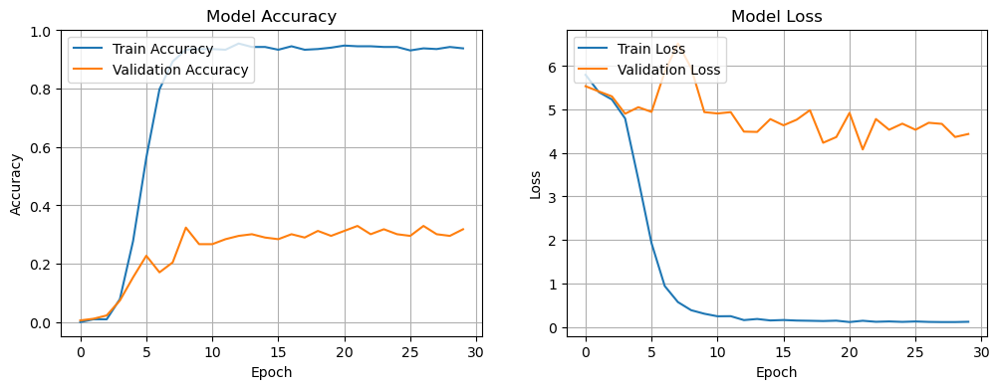

In [36]:
# Check the history keys to see what's available
print(history.history.keys())

# Plot training & validation accuracy values if available
plt.figure(figsize=(12, 4))

if 'accuracy' in history.history:
    plt.subplot(1, 2, 1)
    plt.plot(history.history['accuracy'], label='Train Accuracy')
    
    # Check if 'val_accuracy' exists
    if 'val_accuracy' in history.history:
        plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
        plt.title('Model Accuracy')
    else:
        plt.title('Training Accuracy Only')
    
    plt.ylabel('Accuracy')
    plt.xlabel('Epoch')
    plt.legend(loc='upper left')
    plt.grid()

# Plot training & validation loss values if available
plt.subplot(1, 2, 2)
plt.plot(history.history['loss'], label='Train Loss')

if 'val_loss' in history.history:
    plt.plot(history.history['val_loss'], label='Validation Loss')
    plt.title('Model Loss')
else:
    plt.title('Training Loss Only')

plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(loc='upper left')
plt.grid()

plt.show()


C:\Users\Zunaira\AppData\Roaming\Python\Python310\site-packages\tensorflow\python\data\ops\structured_function.py:264: UserWarning: Even though the `tf.config.experimental_run_functions_eagerly` option is set, this option does not apply to tf.data functions. To force eager execution of tf.data functions, please use `tf.data.experimental.enable_debug_mode()`.
  warnings.warn(


12/12 [==============================] - 4s 291ms/step


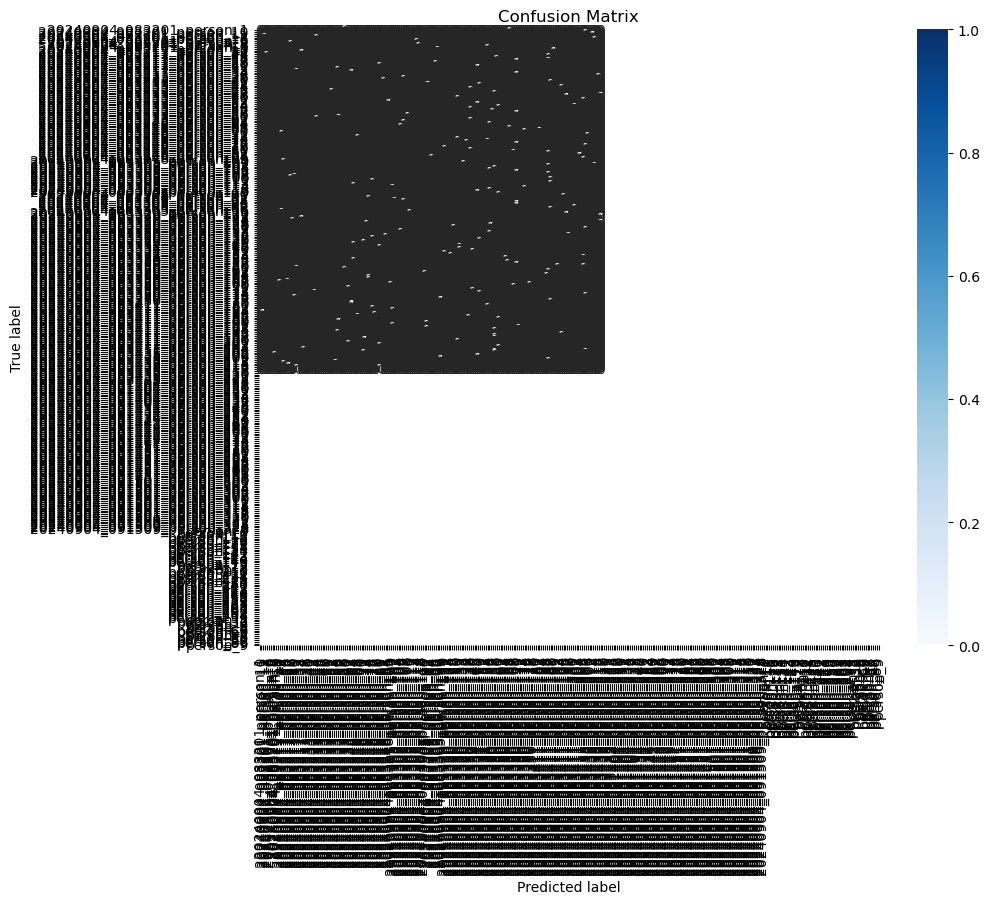

ValueError: Number of classes, 185, does not match size of target_names, 335. Try specifying the labels parameter

In [37]:

import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix, classification_report
import seaborn as sns



# Make predictions on the test data
Y_pred = model.predict(test_generator, steps=test_generator.samples // test_generator.batch_size + 1)
y_pred = np.argmax(Y_pred, axis=1)  # Get the class with the highest probability

# Get the true labels from the test data
y_true = test_generator.classes

# Compute the confusion matrix
cm = confusion_matrix(y_true, y_pred)

# Set up the matplotlib figure
plt.figure(figsize=(10, 8))

# Create a heatmap for the confusion matrix
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=test_generator.class_indices.keys(), yticklabels=test_generator.class_indices.keys())
plt.ylabel('True label')
plt.xlabel('Predicted label')
plt.title('Confusion Matrix')
plt.show()

# Optional: Print classification report
print(classification_report(y_true, y_pred, target_names=test_generator.class_indices.keys()))


## <span style="color: cyan;">5. Comaprison with Manual Feature Extaction</span>

## <span style="color: orange;">-- 1. Feature Extraction Using HOG and SIFT</span>

In [38]:
from skimage import io
from skimage.feature import hog
from skimage.color import rgb2gray
from skimage.transform import resize
import numpy as np
import os

def extract_hog_features(images):
    features = []
    for img in images:
        img_resized = resize(img, (500, 250))  # Resize if necessary
        hog_feature = hog(img_resized, orientations=8, pixels_per_cell=(16, 16), 
                           cells_per_block=(1, 1), visualize=False)
        features.append(hog_feature)
    return np.array(features)


In [40]:
import cv2

def extract_sift_features(images):
    sift = cv2.SIFT_create()
    features = []
    for img in images:
        img_gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
        keypoints, descriptors = sift.detectAndCompute(img_gray, None)
        if descriptors is not None:
            features.append(np.mean(descriptors, axis=0))  # Average descriptors for simplicity
        else:
            features.append(np.zeros((128,)))  # Zero vector if no features found
    return np.array(features)


In [160]:

# Load images from folders
def load_images_from_folder(folder):
    images = []
    for filename in os.listdir(folder):
        img_path = os.path.join(folder, filename)
        img = cv2.imread(img_path)
        if img is not None:
            images.append(img)
    return images

# Example usage
folder_path = "C:\\Users\\Zunaira\\Downloads\\Assignment_1_upload\\Assignment_1_upload\\Data\\train_test_data\\train_data" # Replace with your folder path
images = load_images_from_folder(folder_path)
hog_features = extract_hog_features(images)
sift_features = extract_sift_features(images)

In [41]:
import os

# Path to your dataset
data_dir = "C:\\Users\\Zunaira\\Downloads\\Assignment_1_upload\\Assignment_1_upload\\Data\\train_test_data\\train_data"  # Change this to your actual path
folders = os.listdir(data_dir)

# Create a dictionary to map folder names to labels
label_map = {folder: idx for idx, folder in enumerate(folders)}

# Create lists to store image data and labels
images = []
labels = []

# Iterate through each folder and load images
for folder in folders:
    folder_path = os.path.join(data_dir, folder)
    for filename in os.listdir(folder_path):
        if filename.endswith('.jpg') or filename.endswith('.png'):  # Adjust file types as needed
            img_path = os.path.join(folder_path, filename)
            images.append(img_path)
            labels.append(label_map[folder])  # Use the mapped label

# Now you have images and corresponding labels


In [163]:
print(f"hog_features shape: {len(hog_features)}")
print(f"labels shape: {len(labels)}")


hog_features shape: 0
labels shape: 26


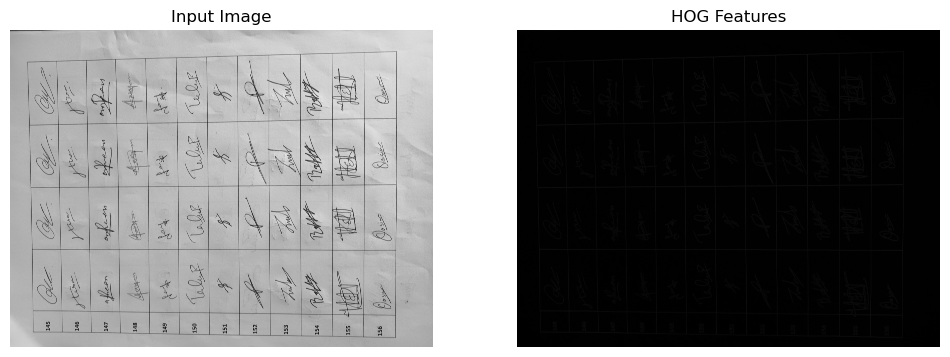

HOG feature vector length: 26937036


In [42]:
import matplotlib.pyplot as plt
from skimage.feature import hog
from skimage import color, exposure, io
import numpy as np

# 1. Load Image (replace 'your_image.jpg' with your actual image file path)
image = io.imread("C:\\Users\\Zunaira\\Downloads\\Assignment_1_upload\\Assignment_1_upload\\Data\\20240904_091442.jpg")

# 2. Convert to Grayscale
gray_image = color.rgb2gray(image)

# 3. Apply HOG Feature Extraction
hog_features, hog_image = hog(gray_image,
                              pixels_per_cell=(8, 8),  # Size of the cell (8x8)
                              cells_per_block=(2, 2),  # Number of cells in a block
                              orientations=9,          # Number of orientation bins
                              block_norm='L2-Hys',      # Normalization method (L2-Hys or L2)
                              visualize=True,           # To get HOG visualization image
                              feature_vector=True)      # Output flattened feature vector

# 4. Visualize the original and HOG images
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 6), sharex=True, sharey=True)

ax1.axis('off')
ax1.imshow(gray_image, cmap=plt.cm.gray)
ax1.set_title('Input Image')

# Rescale HOG image for better display
hog_image_rescaled = exposure.rescale_intensity(hog_image, in_range=(0, 10))

ax2.axis('off')
ax2.imshow(hog_image_rescaled, cmap=plt.cm.gray)
ax2.set_title('HOG Features')

plt.show()

# 5. Print the HOG feature vector size
print(f"HOG feature vector length: {len(hog_features)}")


In [166]:
import cv2

# Check if SIFT is available
sift = cv2.SIFT_create()
print("SIFT is available!")


SIFT is available!


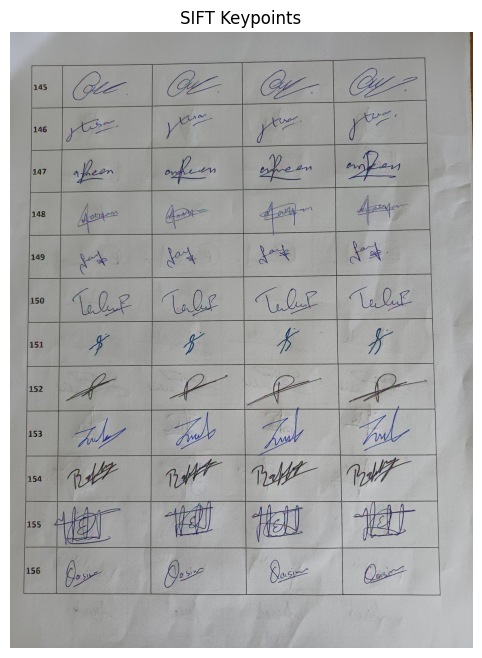

Number of keypoints detected: 9890
Descriptor shape: (9890, 128)


In [167]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# 1. Load the image (replace 'your_image.jpg' with your actual image path)
image = cv2.imread("C:\\Users\\Zunaira\\Downloads\\Assignment_1_upload\\Assignment_1_upload\\Data\\20240904_091442.jpg")

# 2. Convert to grayscale
gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

# 3. Create a SIFT detector object
sift = cv2.SIFT_create()

# 4. Detect keypoints and compute descriptors
keypoints, descriptors = sift.detectAndCompute(gray_image, None)

# 5. Draw keypoints on the original image for visualization
image_with_keypoints = cv2.drawKeypoints(image, keypoints, None, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

# 6. Plot the image with keypoints
plt.figure(figsize=(12, 8))
plt.imshow(cv2.cvtColor(image_with_keypoints, cv2.COLOR_BGR2RGB))
plt.title("SIFT Keypoints")
plt.axis('off')
plt.show()

# 7. Print the number of keypoints and the shape of the descriptor array
print(f"Number of keypoints detected: {len(keypoints)}")
print(f"Descriptor shape: {descriptors.shape}")


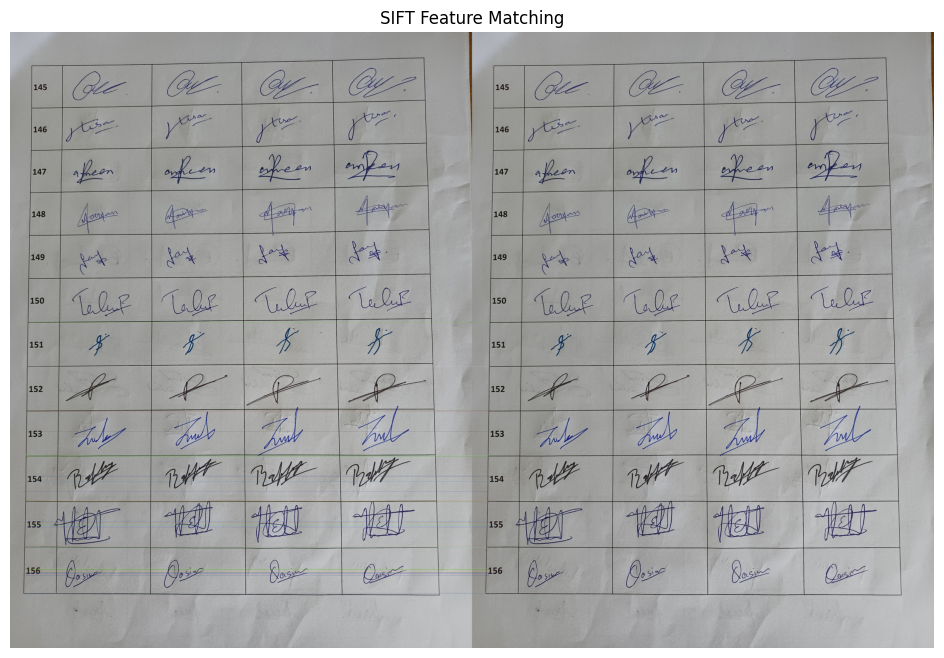

In [168]:
# Load another image to match (replace 'another_image.jpg' with your image path)
image2 = cv2.imread("C:\\Users\\Zunaira\\Downloads\\Assignment_1_upload\\Assignment_1_upload\\Data\\20240904_091442.jpg")
gray_image2 = cv2.cvtColor(image2, cv2.COLOR_BGR2GRAY)

# Detect keypoints and descriptors in the second image
keypoints2, descriptors2 = sift.detectAndCompute(gray_image2, None)

# Use BFMatcher for matching descriptors
bf = cv2.BFMatcher(cv2.NORM_L2, crossCheck=True)
matches = bf.match(descriptors, descriptors2)

# Sort the matches based on distance (lower is better)
matches = sorted(matches, key=lambda x: x.distance)

# Draw the first 50 matches
matched_image = cv2.drawMatches(image, keypoints, image2, keypoints2, matches[:50], None, flags=2)

# Plot the matched images
plt.figure(figsize=(12, 8))
plt.imshow(cv2.cvtColor(matched_image, cv2.COLOR_BGR2RGB))
plt.title("SIFT Feature Matching")
plt.axis('off')
plt.show()


In [ ]:
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense

# descriptors are sift features 


# Assuming you have already extracted the HOG and SIFT features using the previous code
# X_hog contains the HOG features and X_sift contains the SIFT features

# 1. Concatenate HOG and SIFT features
def concatenate_features(hog_features, sift_features):
    # Assuming hog_features and sift_features are NumPy arrays
    return np.concatenate((hog_features, sift_features), axis=1)

# Assuming X_hog and X_sift are the extracted HOG and SIFT features respectively
# For example: X_hog = np.array([hog_feature_1, hog_feature_2, ...])
#              X_sift = np.array([sift_feature_1, sift_feature_2, ...])
X_hog = np.array([hog_features])  # Placeholder
X_sift = np.array([descriptors])  # Placeholder

# Combine the features for each image
X_combined = concatenate_features(X_hog, X_sift)

# Assuming y contains the labels for the dataset
y = np.array([label_1, label_2, ...])  # Replace with your actual labels

# 2. Standardize the features (important for ANN training)
scaler = StandardScaler()
X_combined_scaled = scaler.fit_transform(X_combined)

# 3. Split the dataset into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X_combined_scaled, y, test_size=0.2, random_state=42)

# 4. Define the ANN model
model = Sequential()
model.add(Dense(128, input_dim=X_train.shape[1], activation='relu'))  # First hidden layer
model.add(Dense(64, activation='relu'))  # Second hidden layer
model.add(Dense(32, activation='relu'))  # Third hidden layer
model.add(Dense(1, activation='sigmoid'))  # Output layer (binary classification)

# 5. Compile the model
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

# 6. Train the model
history = model.fit(X_train, y_train, epochs=20, batch_size=32, validation_data=(X_test, y_test))

# 7. Evaluate the model
test_loss, test_accuracy = model.evaluate(X_test, y_test)
print(f"Test Accuracy: {test_accuracy * 100:.2f}%")


## <span style="color: orange;">-- Manual Feature Engineering </span>

### <span style="color: #9966ff;">--- HOG</span>